# TO PREDICT THE PROBABLITY OF DEFAULT OF CREDIT CARD CLIENTS

# ATTRIBUTES DESCRIPTION:


X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.

X2: Gender (1 = male; 2 = female).

X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).

X4: Marital status (1 = married; 2 = single; 3 = others).

X5: Age (year).

X6 - X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows:

X6 = The repayment status in September, 2005.

X7 = The repayment status in August, 2005.

....

X11 = The repayment status in April, 2005.

The measurement scale for the repayment status is:
(-2 = No consumption; -1 = Paid in full; 0 = The use of revolving credit; 1 = payment delay for one month; 2 = payment delay for two months; .... 8 = payment delay for eight months; 9 = payment delay for nine months and above).

X12-X17: Amount of bill statement (NT dollar).

X12 = Amount of bill statement in September, 2005.

X13 = Amount of bill statement in August, 2005.

....

X17 = Amount of bill statement in April, 2005.

X18-X23: Amount of previous payment (NT dollar).

X18 = Amount paid in September, 2005.

X19 = Amount paid in August, 2005.

....

X23 = Amount paid in April, 2005.

# IMPORTING THE LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import graphviz as graphviz

from warnings import filterwarnings
filterwarnings('ignore')

from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc, precision_score, recall_score, f1_score, accuracy_score
from sklearn.ensemble import RandomForestClassifier 
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTENC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
import pylab as pl
from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image
from xgboost import plot_tree
from tune_sklearn import TuneGridSearchCV

# LOAD THE DATASET AND RESETTING IT TO PROPER TABLE

In [2]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [3]:
df = pd.read_excel('default of credit card clients.xls')

In [4]:
df.head()

,Unnamed: 0,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,Y
0,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
1,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
2,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0


In [5]:
df.columns = df.iloc[0]

In [6]:
df = df.drop(0)

In [7]:
df = df.reset_index(drop = True)

In [8]:
df = df.rename(columns = {'default payment next month' : 'DEFAULT', 'PAY_0' : 'PAY_1'})

In [9]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [10]:
df.shape

(30000, 25)

# DATA PREPROCESSING

# FINDING DUPLICATE ROWS

In [11]:
sum(df.duplicated())

0

# ROWS THAT HAVE MEANINGLESS VALUES

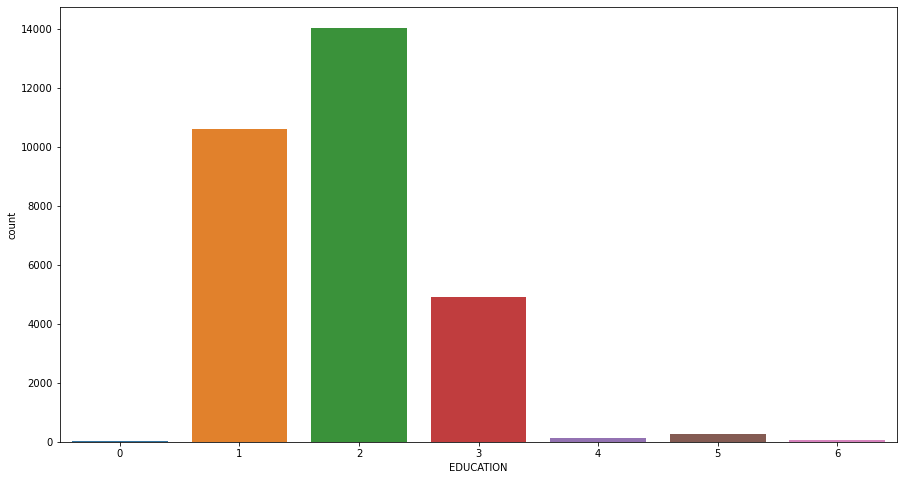

In [12]:
plt.figure(figsize= (15,8))
sns.countplot(df['EDUCATION'])
plt.show()

## In this column 0,5,6 makes no sense and doesn't represent anything

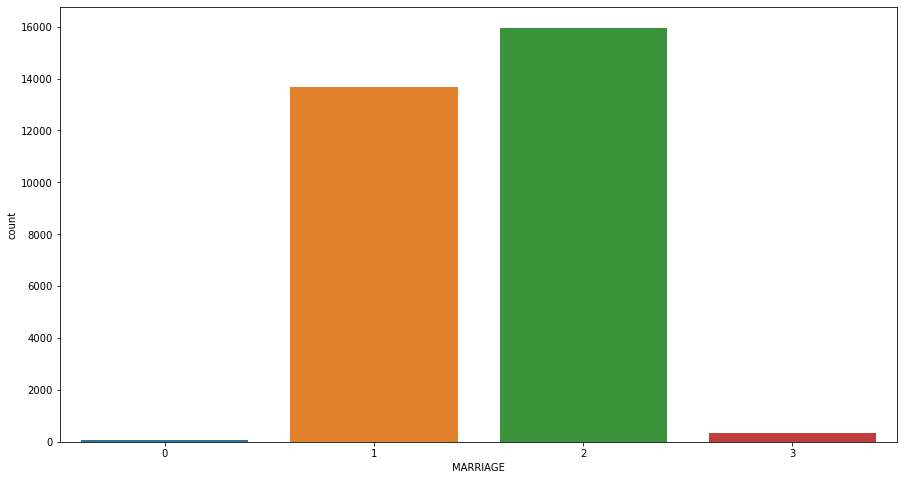

In [13]:
plt.figure(figsize= (15,8))
sns.countplot(df['MARRIAGE'])
plt.show()

## Here 0 makes no sense, hence removed

In [14]:
fill = (df.EDUCATION == 5) | (df.EDUCATION == 0) | (df.EDUCATION == 6) 
df.loc[fill,'EDUCATION'] = 2

In [15]:
df.EDUCATION.value_counts()

2    14375
1    10585
3     4917
4      123
Name: EDUCATION, dtype: int64

In [16]:
fill = (df.MARRIAGE == 0) 
df.loc[fill,'MARRIAGE'] = 2

In [17]:
df.MARRIAGE.value_counts()

2    16018
1    13659
3      323
Name: MARRIAGE, dtype: int64

In [18]:
df = df.drop(['ID'], 1)

ID column is not a significant feature. Hence dropped.

In [19]:
df.shape

(30000, 24)

# CONVERSION OF COLUMNS TO APPROPRIATE DATATYPE

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   LIMIT_BAL  30000 non-null  object
 1   SEX        30000 non-null  object
 2   EDUCATION  30000 non-null  object
 3   MARRIAGE   30000 non-null  object
 4   AGE        30000 non-null  object
 5   PAY_1      30000 non-null  object
 6   PAY_2      30000 non-null  object
 7   PAY_3      30000 non-null  object
 8   PAY_4      30000 non-null  object
 9   PAY_5      30000 non-null  object
 10  PAY_6      30000 non-null  object
 11  BILL_AMT1  30000 non-null  object
 12  BILL_AMT2  30000 non-null  object
 13  BILL_AMT3  30000 non-null  object
 14  BILL_AMT4  30000 non-null  object
 15  BILL_AMT5  30000 non-null  object
 16  BILL_AMT6  30000 non-null  object
 17  PAY_AMT1   30000 non-null  object
 18  PAY_AMT2   30000 non-null  object
 19  PAY_AMT3   30000 non-null  object
 20  PAY_AMT4   30000 non-null  o

In [21]:
df[['LIMIT_BAL','AGE',
    'BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6',
    'PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']] = df[['LIMIT_BAL','AGE',
                                                                              'BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6',
                                                                              'PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].astype('int')

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   LIMIT_BAL  30000 non-null  int64 
 1   SEX        30000 non-null  object
 2   EDUCATION  30000 non-null  object
 3   MARRIAGE   30000 non-null  object
 4   AGE        30000 non-null  int64 
 5   PAY_1      30000 non-null  object
 6   PAY_2      30000 non-null  object
 7   PAY_3      30000 non-null  object
 8   PAY_4      30000 non-null  object
 9   PAY_5      30000 non-null  object
 10  PAY_6      30000 non-null  object
 11  BILL_AMT1  30000 non-null  int64 
 12  BILL_AMT2  30000 non-null  int64 
 13  BILL_AMT3  30000 non-null  int64 
 14  BILL_AMT4  30000 non-null  int64 
 15  BILL_AMT5  30000 non-null  int64 
 16  BILL_AMT6  30000 non-null  int64 
 17  PAY_AMT1   30000 non-null  int64 
 18  PAY_AMT2   30000 non-null  int64 
 19  PAY_AMT3   30000 non-null  int64 
 20  PAY_AMT4   30000 non-null  i

# SPLITTING THE DATA INTO NUMERICAL AND CATEGORICAL

In [23]:
num_df = df.select_dtypes(include = np.number)
cat_df = df.select_dtypes(exclude = np.number)

In [24]:
num_df.describe()

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,167484.322667,35.485500,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,129747.661567,9.217904,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,10000.000000,21.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,50000.000000,28.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,140000.000000,34.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,240000.000000,41.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
max,1000000.000000,79.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000


In [25]:
cat_df.describe()

,SEX,EDUCATION,MARRIAGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,DEFAULT
count,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000
unique,2,4,3,11,11,11,11,10,10,2
top,2,2,2,0,0,0,0,0,0,0
freq,18112,14375,16018,14737,15730,15764,16455,16947,16286,23364


# MISSING VALUE ANALYSIS

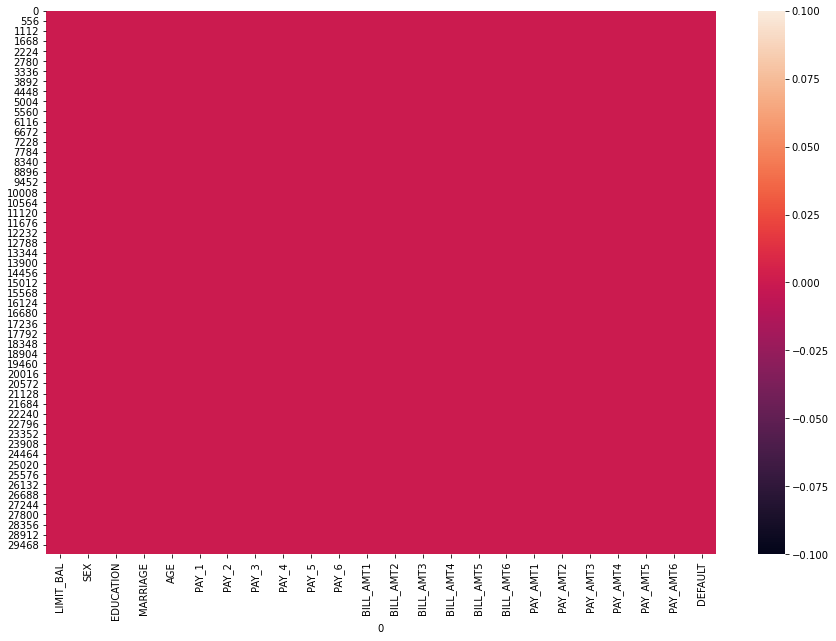

In [26]:
plt.figure(figsize = (15,10))
sns.heatmap(df.isnull(), cbar = True)

plt.show()

In [27]:
(df.isnull().sum() / len(df)) * 100

0
LIMIT_BAL    0.0
SEX          0.0
EDUCATION    0.0
MARRIAGE     0.0
AGE          0.0
PAY_1        0.0
PAY_2        0.0
PAY_3        0.0
PAY_4        0.0
PAY_5        0.0
PAY_6        0.0
BILL_AMT1    0.0
BILL_AMT2    0.0
BILL_AMT3    0.0
BILL_AMT4    0.0
BILL_AMT5    0.0
BILL_AMT6    0.0
PAY_AMT1     0.0
PAY_AMT2     0.0
PAY_AMT3     0.0
PAY_AMT4     0.0
PAY_AMT5     0.0
PAY_AMT6     0.0
DEFAULT      0.0
dtype: float64

No missing values in this data.

# OUTLIER DETECTION

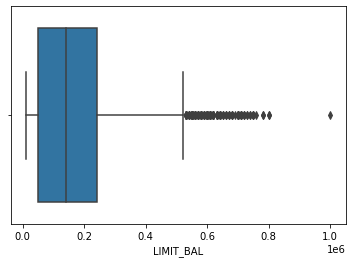

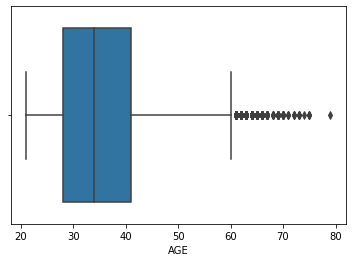

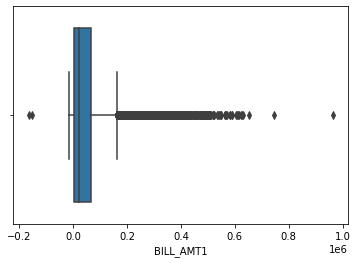

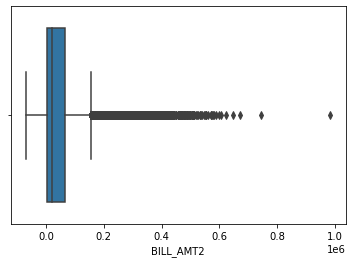

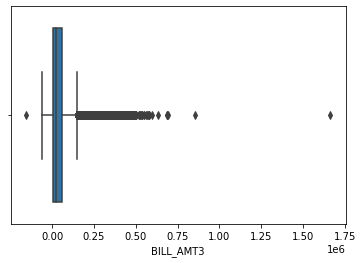

...

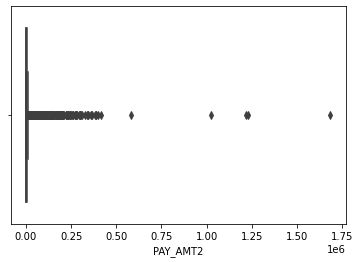

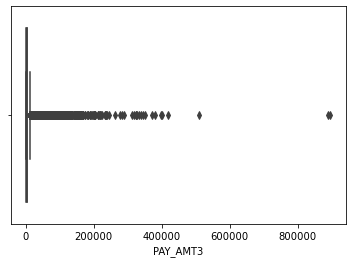

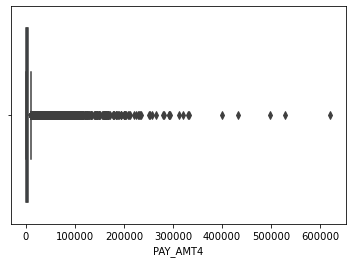

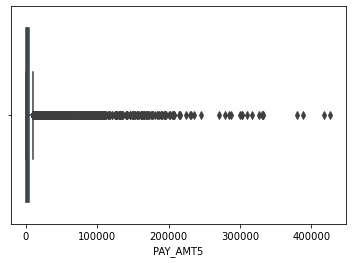

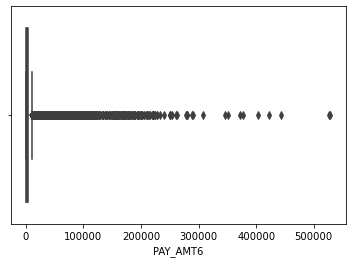

In [28]:
for i in num_df.columns:
    sns.boxplot(num_df[i])
    plt.show()

In [29]:
for i in num_df.columns:
    Q1 = num_df[i].quantile(0.25)
    Q3 = num_df[i].quantile(0.75)
    
    IQR = Q3 - Q1
    
    ub = Q3 + 1.5 * IQR
    lb = Q1 - 1.5 * IQR
    
    print('The number of outliers in ',i, ' is ',len(num_df[((num_df[i] > ub) | (num_df[i] < lb))]))

The number of outliers in  LIMIT_BAL  is  167
The number of outliers in  AGE  is  272
The number of outliers in  BILL_AMT1  is  2400
The number of outliers in  BILL_AMT2  is  2395
The number of outliers in  BILL_AMT3  is  2469
The number of outliers in  BILL_AMT4  is  2622
The number of outliers in  BILL_AMT5  is  2725
The number of outliers in  BILL_AMT6  is  2693
The number of outliers in  PAY_AMT1  is  2745
The number of outliers in  PAY_AMT2  is  2714
The number of outliers in  PAY_AMT3  is  2598
The number of outliers in  PAY_AMT4  is  2994
The number of outliers in  PAY_AMT5  is  2945
The number of outliers in  PAY_AMT6  is  2958


Even though there are large number of outliers, we cannot treat the outliers as they are significant and according to the domain, it is possible to have outliers in the bill amount and payment amount.

# STATISTICAL TEST

In [30]:
# Checking Statistical significance of independent categorical variables with Target: 

for i in df[['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']]: 
    print("\033[1m" + "Hypothesis Formation:" + "\033[0m")
    print("Null Hypothesis (Ho):",i,"and DEFAULT are independent")
    print("Alternate Hypothesis (Ha):",i,"and DEFAULT are dependent")
    print()
    
    obs = pd.crosstab(df[i], df['DEFAULT']) 
    test_stat, pval, dof, exp = stats.chi2_contingency(obs)
    
    print("\033[1m" + "Statistical Significance of relationship between",i,"and DEFAULT:" + "\033[0m") 
    print("Test Statistics: ", test_stat)
    print("pValue: ", pval) 
    print("Degrees of freedom: ", dof) 
    print("\n***************************************************************************************************\n")

Hypothesis Formation:
Null Hypothesis (Ho): SEX and DEFAULT are independent
Alternate Hypothesis (Ha): SEX and DEFAULT are dependent

Statistical Significance of relationship between SEX and DEFAULT:
Test Statistics:  47.70879689062111
pValue:  4.944678999412044e-12
Degrees of freedom:  1

***************************************************************************************************

Hypothesis Formation:
Null Hypothesis (Ho): EDUCATION and DEFAULT are independent
Alternate Hypothesis (Ha): EDUCATION and DEFAULT are dependent

Statistical Significance of relationship between EDUCATION and DEFAULT:
Test Statistics:  109.30136242385805
pValue:  1.5512571274062487e-23
Degrees of freedom:  3

***************************************************************************************************

Hypothesis Formation:
Null Hypothesis (Ho): MARRIAGE and DEFAULT are independent
Alternate Hypothesis (Ha): MARRIAGE and DEFAULT are dependent

Statistical Significance of relationship between MAR

Inference: 
    
    ==>  From the results of statistical significance analysis of independent categorical variables with target using Chi-Square Test for Independence, we could see the pValue from all the statistical analysis is less than the significance level of 5% (0.05). 
    
    ==>  Hence Null hypothesis (Ho) is rejected and Alternate Hypothesis (Ha) can be selected. Thus, it is evident that all the independent categorical variables have significant relationship with the target variable.

# CONDITION CHECK FOR ANOVA TEST

### NORMALITY CHECK

In [31]:
a0 = df[df['DEFAULT'] == 0]['LIMIT_BAL']
a1 = df[df['DEFAULT'] == 1]['LIMIT_BAL']

b0 = df[df['DEFAULT'] == 0]['AGE']
b1 = df[df['DEFAULT'] == 1]['AGE']

In [32]:
c0 = df[df['DEFAULT'] == 0]['BILL_AMT1']
c1 = df[df['DEFAULT'] == 1]['BILL_AMT1']

d0 = df[df['DEFAULT'] == 0]['BILL_AMT2']
d1 = df[df['DEFAULT'] == 1]['BILL_AMT2']

e0 = df[df['DEFAULT'] == 0]['BILL_AMT3']
e1 = df[df['DEFAULT'] == 1]['BILL_AMT3']

f0 = df[df['DEFAULT'] == 0]['BILL_AMT4']
f1 = df[df['DEFAULT'] == 1]['BILL_AMT4']

g0 = df[df['DEFAULT'] == 0]['BILL_AMT5']
g1 = df[df['DEFAULT'] == 1]['BILL_AMT5']

h0 = df[df['DEFAULT'] == 0]['BILL_AMT6']
h1 = df[df['DEFAULT'] == 1]['BILL_AMT6']

In [33]:
i0 = df[df['DEFAULT'] == 0]['PAY_AMT1']
i1 = df[df['DEFAULT'] == 1]['PAY_AMT1']

j0 = df[df['DEFAULT'] == 0]['PAY_AMT2']
j1 = df[df['DEFAULT'] == 1]['PAY_AMT2']

k0 = df[df['DEFAULT'] == 0]['PAY_AMT3']
k1 = df[df['DEFAULT'] == 1]['PAY_AMT3']

l0 = df[df['DEFAULT'] == 0]['PAY_AMT4']
l1 = df[df['DEFAULT'] == 1]['PAY_AMT4']

m0 = df[df['DEFAULT'] == 0]['PAY_AMT5']
m1 = df[df['DEFAULT'] == 1]['PAY_AMT5']

n0 = df[df['DEFAULT'] == 0]['PAY_AMT6']
n1 = df[df['DEFAULT'] == 1]['PAY_AMT6']

In [34]:
# Test of Normality 

# Ho: skew = 0
# Ha: skew != 0

print("Shapiro result for a0:",stats.shapiro(a0))
print("Shapiro result for a1:",stats.shapiro(a1))
print("Shapiro result for b0:",stats.shapiro(b0))
print("Shapiro result for b1:",stats.shapiro(b1))
print("Shapiro result for c0:",stats.shapiro(c0)) 
print("Shapiro result for c1",stats.shapiro(c1)) 
print("Shapiro result for d0:",stats.shapiro(d0)) 
print("Shapiro result for d1:",stats.shapiro(d1)) 
print("Shapiro result for e0:",stats.shapiro(e0))
print("Shapiro result for e1:",stats.shapiro(e1))
print("Shapiro result for f0:",stats.shapiro(f0))
print("Shapiro result for f1:",stats.shapiro(f1))
print("Shapiro result for g0:",stats.shapiro(g0)) 
print("Shapiro result for g1",stats.shapiro(g1)) 
print("Shapiro result for h0:",stats.shapiro(h0)) 
print("Shapiro result for h1:",stats.shapiro(h1)) 
print("Shapiro result for i0:",stats.shapiro(i0))
print("Shapiro result for i1:",stats.shapiro(i1))
print("Shapiro result for j0:",stats.shapiro(j0))
print("Shapiro result for j1:",stats.shapiro(j1))
print("Shapiro result for k0:",stats.shapiro(k0)) 
print("Shapiro result for k1",stats.shapiro(k1)) 
print("Shapiro result for l0:",stats.shapiro(l0)) 
print("Shapiro result for l1:",stats.shapiro(l1)) 
print("Shapiro result for m0:",stats.shapiro(m0))
print("Shapiro result for m1:",stats.shapiro(m1))
print("Shapiro result for n0:",stats.shapiro(n0))
print("Shapiro result for n1:",stats.shapiro(n1))

Shapiro result for a0: ShapiroResult(statistic=0.9197262525558472, pvalue=0.0)
Shapiro result for a1: ShapiroResult(statistic=0.8549829721450806, pvalue=0.0)
Shapiro result for b0: ShapiroResult(statistic=0.9496142864227295, pvalue=0.0)
Shapiro result for b1: ShapiroResult(statistic=0.9501640200614929, pvalue=1.0733946236728099e-42)
Shapiro result for c0: ShapiroResult(statistic=0.7077071666717529, pvalue=0.0)
Shapiro result for c1 ShapiroResult(statistic=0.6597214341163635, pvalue=0.0)
Shapiro result for d0: ShapiroResult(statistic=0.7044762372970581, pvalue=0.0)
Shapiro result for d1: ShapiroResult(statistic=0.6616373062133789, pvalue=0.0)
Shapiro result for e0: ShapiroResult(statistic=0.6865330934524536, pvalue=0.0)
Shapiro result for e1: ShapiroResult(statistic=0.6634527444839478, pvalue=0.0)
Shapiro result for f0: ShapiroResult(statistic=0.6877426505088806, pvalue=0.0)
Shapiro result for f1: ShapiroResult(statistic=0.6591142416000366, pvalue=0.0)
Shapiro result for g0: ShapiroResu

Inference:

    ==> pValue of Shapiro Result for scores of different adverse effects < 0.05 (sig. lvl).
    
    ==> Hence, Ho is rejected and so data is not normal .

### VARIANCE CHECK

In [35]:
# Test for equality of variance 

# Ho: All variances are equal
# Ha: Atleast one variance is different 

print(stats.levene(a0,a1,b0,b1,c0,c1,d0,d1,e0,e1,f0,f1,g0,g1,h0,h1,i0,i1,j0,j1,k0,k1,l0,l1,m0,m1,n0,n1)) 

LeveneResult(statistic=5315.887946507826, pvalue=0.0)


Inference:

    ==> pValue of Levene Result for scores of different adverse effects < 0.05 (sig. lvl).
    
    ==> Hence, Ho is rejected and all variances are not equal. 

Since it doesn't satisfy both the conditions, we can't use ANOVA test here. Hence Non-Parametric test is used.

# NON-PARAMETRIC TEST (KRUSKAL TEST)

In [36]:
# Hypothesis for Kruskal: 

# Ho: All medians are equal
# Ha: Atleast one median is different

In [37]:
stats.kruskal(a0,a1,b0,b1,c0,c1,d0,d1,e0,e1,f0,f1,g0,g1,h0,h1,i0,i1,j0,j1,k0,k1,l0,l1,m0,m1,n0,n1)

KruskalResult(statistic=159267.7136315139, pvalue=0.0)

Inference:

    ==> pValue of Kruskal Result for scores of different adverse effects < 0.05 (sig. lvl) 
   
    ==> Hence, Ho is rejected and all medians are not equal. 

# BILL AMOUNT vs DEFAULT CREDIT CARD CUSTOMERS

In [38]:
df.groupby('DEFAULT')['BILL_AMT1'].sum() / df['BILL_AMT1'].sum() * 100

DEFAULT
0    79.052072
1    20.947928
Name: BILL_AMT1, dtype: float64

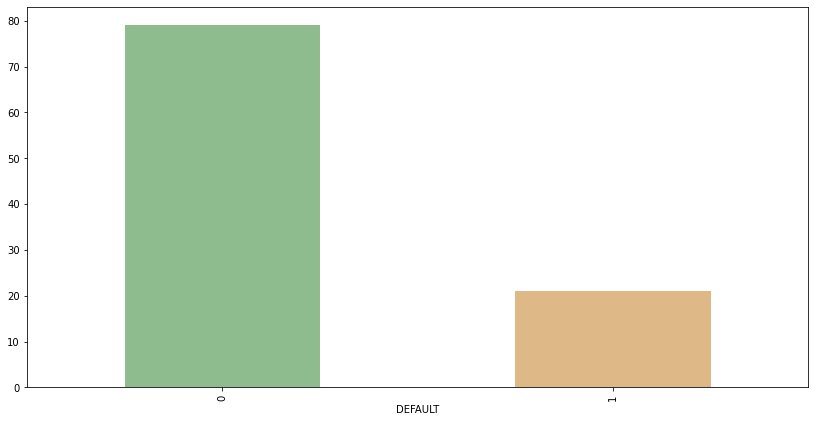

In [39]:
plt.figure(figsize = (14,7))
(df.groupby('DEFAULT')['BILL_AMT1'].sum() / df['BILL_AMT1'].sum() * 100).plot(kind = 'bar', color = ['darkseagreen','burlywood'])
plt.show()

In [40]:
df.groupby('DEFAULT')['BILL_AMT2'].sum() / df['BILL_AMT2'].sum() * 100

DEFAULT
0    78.732548
1    21.267452
Name: BILL_AMT2, dtype: float64

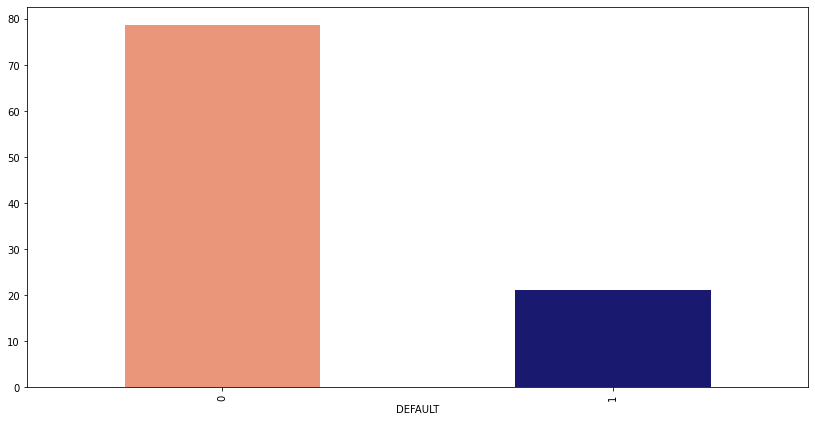

In [41]:
plt.figure(figsize = (14,7))
(df.groupby('DEFAULT')['BILL_AMT2'].sum() / df['BILL_AMT2'].sum() * 100).plot(kind = 'bar', color = ['darksalmon','midnightblue'])
plt.show()

In [42]:
df.groupby('DEFAULT')['BILL_AMT3'].sum() / df['BILL_AMT3'].sum() * 100

DEFAULT
0    78.741759
1    21.258241
Name: BILL_AMT3, dtype: float64

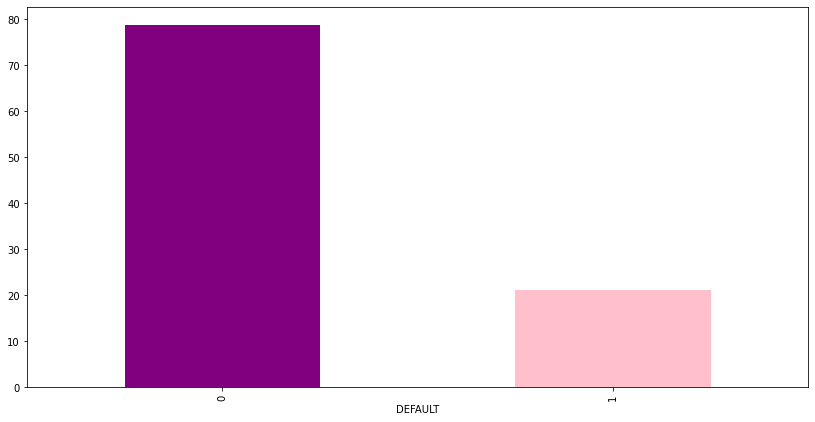

In [43]:
plt.figure(figsize = (14,7))
(df.groupby('DEFAULT')['BILL_AMT3'].sum() / df['BILL_AMT3'].sum() * 100).plot(kind = 'bar', color = ['purple','pink'])
plt.show()

In [44]:
df.groupby('DEFAULT')['BILL_AMT4'].sum() / df['BILL_AMT4'].sum() * 100

DEFAULT
0    78.506843
1    21.493157
Name: BILL_AMT4, dtype: float64

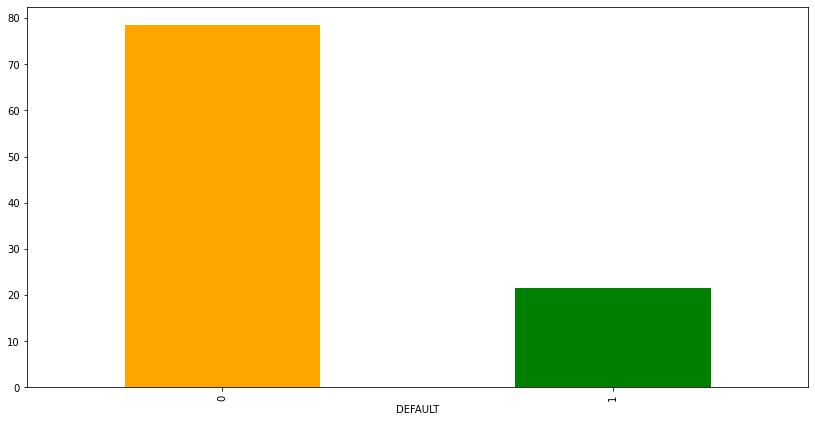

In [45]:
plt.figure(figsize = (14,7))
(df.groupby('DEFAULT')['BILL_AMT4'].sum() / df['BILL_AMT4'].sum() * 100).plot(kind = 'bar', color = ['orange','green'])
plt.show()

In [46]:
df.groupby('DEFAULT')['BILL_AMT5'].sum() / df['BILL_AMT5'].sum() * 100

DEFAULT
0    78.303185
1    21.696815
Name: BILL_AMT5, dtype: float64

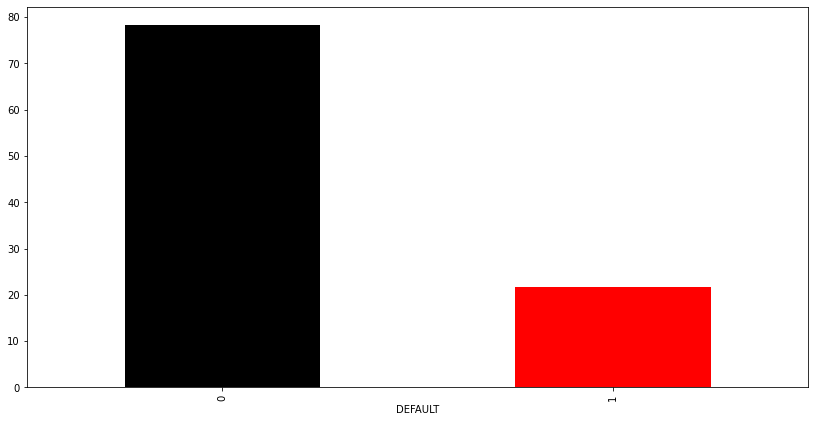

In [47]:
plt.figure(figsize = (14,7))
(df.groupby('DEFAULT')['BILL_AMT5'].sum() / df['BILL_AMT5'].sum() * 100).plot(kind = 'bar', color = ['black','red'])
plt.show()

In [48]:
df.groupby('DEFAULT')['BILL_AMT6'].sum() / df['BILL_AMT6'].sum() * 100

DEFAULT
0    78.221615
1    21.778385
Name: BILL_AMT6, dtype: float64

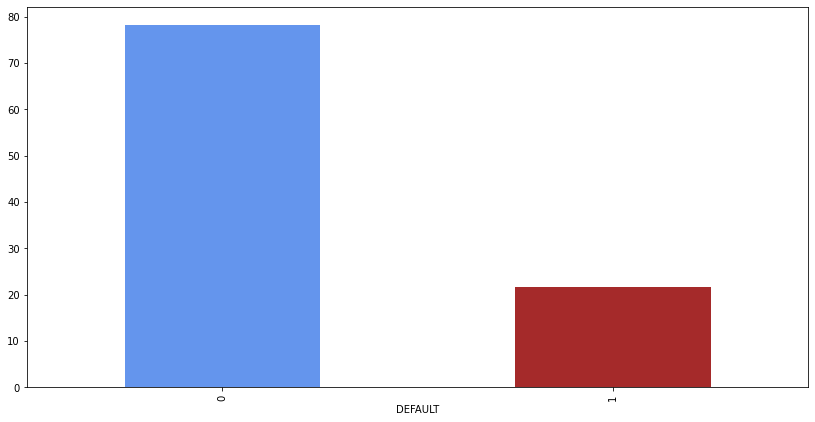

In [49]:
plt.figure(figsize = (14,7))
(df.groupby('DEFAULT')['BILL_AMT6'].sum() / df['BILL_AMT6'].sum() * 100).plot(kind = 'bar', color = ['cornflowerblue','brown'])
plt.show()

# DATA INTERPRETATION USING GRAPHS

## BIVARIATE AND MULTIVARIATE ANALYSIS

### CREDIT LIMIT WITH SEX

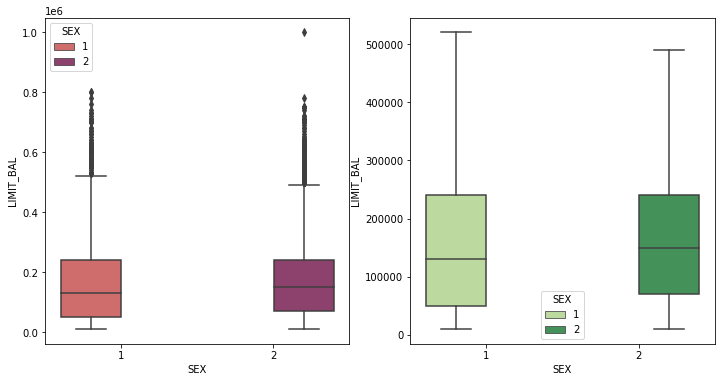

In [50]:
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (12,6))

s1 = sns.boxplot(ax = ax1, x = "SEX", y = "LIMIT_BAL", hue = "SEX", data = df, palette = "flare", showfliers = True)
s2 = sns.boxplot(ax = ax2, x = "SEX", y = "LIMIT_BAL", hue = "SEX", data = df, palette = "YlGn", showfliers = False)

plt.show()

## Credit Limit by Sex. The data is evenly distributed amongst males and females.

### AGE WITH MARRIAGE

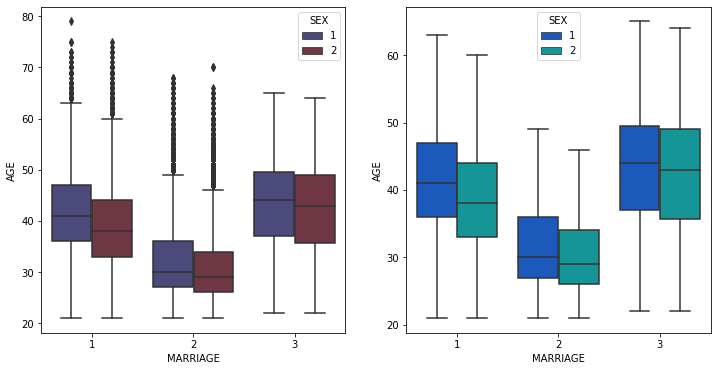

In [51]:
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (12,6))

s3 = sns.boxplot(ax = ax1, x = "MARRIAGE", y = "AGE", hue = "SEX", data = df, palette = "icefire", showfliers = True)
s4 = sns.boxplot(ax = ax2, x = "MARRIAGE", y = "AGE", hue = "SEX", data = df, palette = "winter", showfliers = False)

plt.show()

## The dataset mostly contains couples in their mid-30s to mid-40s and single people in their mid-20s to early-30s.

### EDUCATION WITH AGE

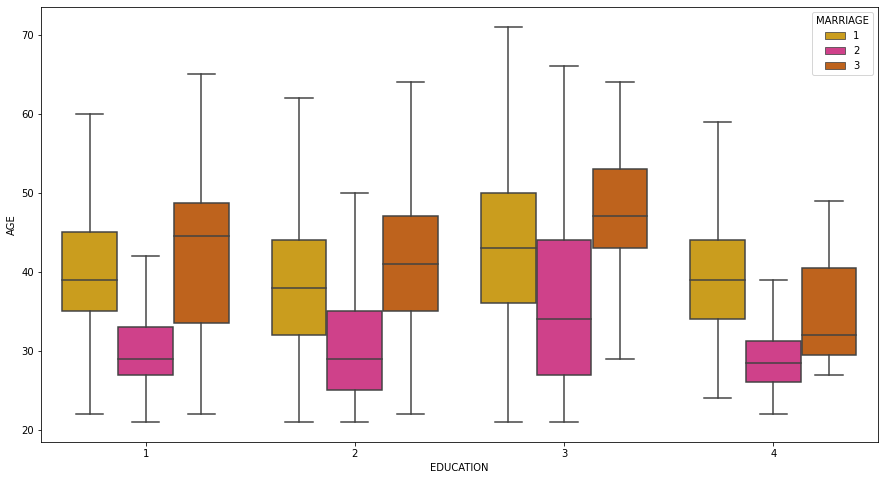

In [52]:
plt.figure(figsize = (15,8))
sns.boxplot(x = "EDUCATION", y = "AGE", hue = "MARRIAGE", data = df, palette = "Dark2_r", showfliers = False)

plt.show()

### AGE WITH LIMIT BALANCE

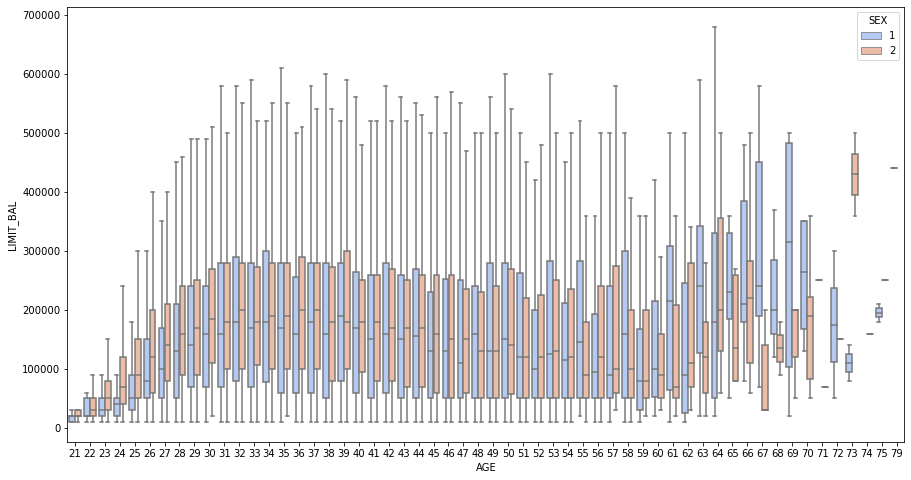

In [53]:
plt.figure(figsize = (15,8))
sns.boxplot(x = "AGE", y = "LIMIT_BAL", hue = "SEX", data = df, palette = "coolwarm", showfliers = False)

plt.show()

Mean, Q3 and Q4 values are increasing for both male and female with age until aroung 35 years and then they are oscilating and get to a maximum of Q4 for males at age 64.

Mean values are generally smaller for males than for females, with few exceptions, for example at age 39, 48, until approximately 60, where mean values for males are generally larger than for females.

### MARRIAGE WITH LIMIT BALANCE

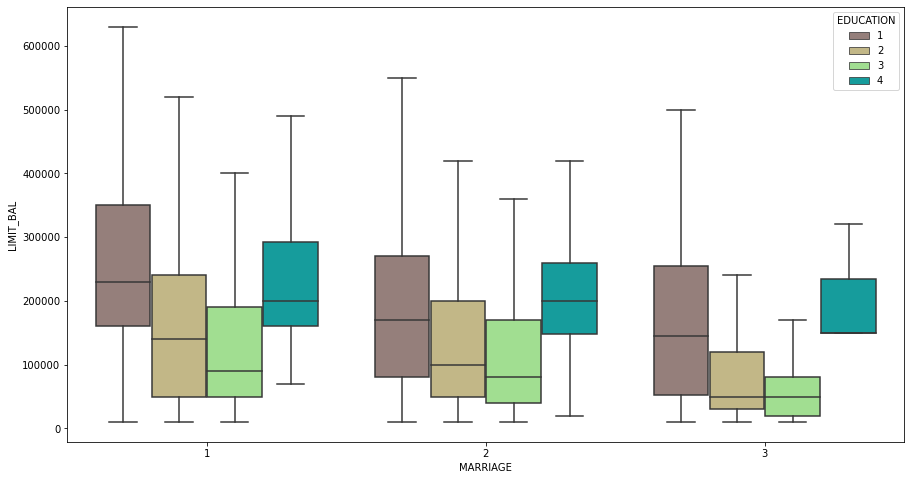

In [54]:
plt.figure(figsize = (15,8))
sns.boxplot(x = "MARRIAGE", y = "LIMIT_BAL", hue = "EDUCATION", data = df, palette = "terrain_r", showfliers = False)

plt.show()

### MAXIMUM LIMIT OF CREDIT CARD LIMIT AMOUNT

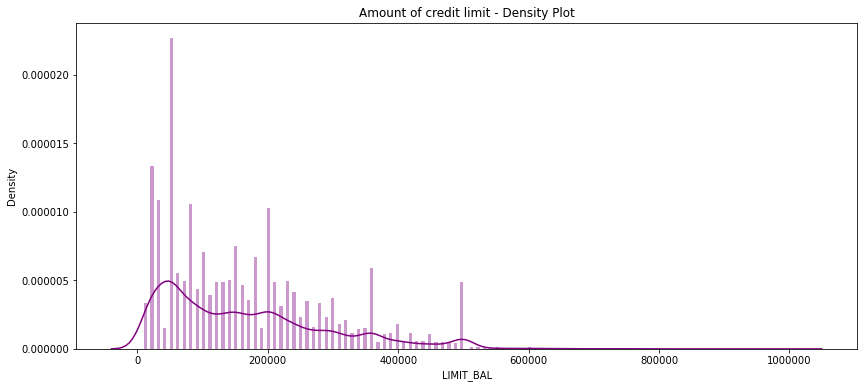

In [55]:
plt.figure(figsize = (14,6))
plt.title('Amount of credit limit - Density Plot')

sns.set_color_codes("pastel")

sns.distplot(df['LIMIT_BAL'], kde = True, bins = 200, color = "purple")
plt.ticklabel_format(useOffset = False, style = 'plain')

plt.show()

In [56]:
df[df['LIMIT_BAL'] > 50000].shape

(22324, 24)

In [57]:
df['LIMIT_BAL'].value_counts().head()

50000     3365
20000     1976
30000     1610
80000     1567
200000    1528
Name: LIMIT_BAL, dtype: int64

The largest number of credit cards are with limit of 50,000

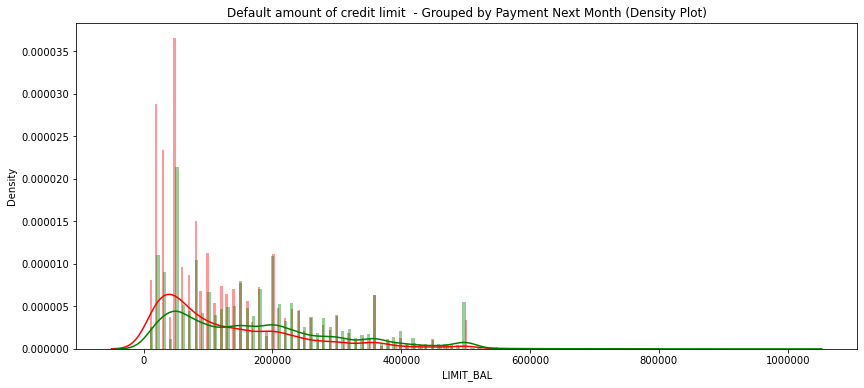

In [58]:
class_0 = df.loc[df['DEFAULT'] == 0]["LIMIT_BAL"]
class_1 = df.loc[df['DEFAULT'] == 1]["LIMIT_BAL"]

plt.figure(figsize = (14,6))
plt.title('Default amount of credit limit  - Grouped by Payment Next Month (Density Plot)')

sns.set_color_codes("pastel")

sns.distplot(class_1, kde = True, bins = 200, color = "red")
sns.distplot(class_0, kde = True, bins = 200, color = "green")
plt.ticklabel_format(useOffset = False, style = 'plain')

plt.show()

# RELATIONSHIP BETWEEN INDEPENDENT AND TARGET VARIABLE

## CATEGORICAL FEATURES vs DEFAULT

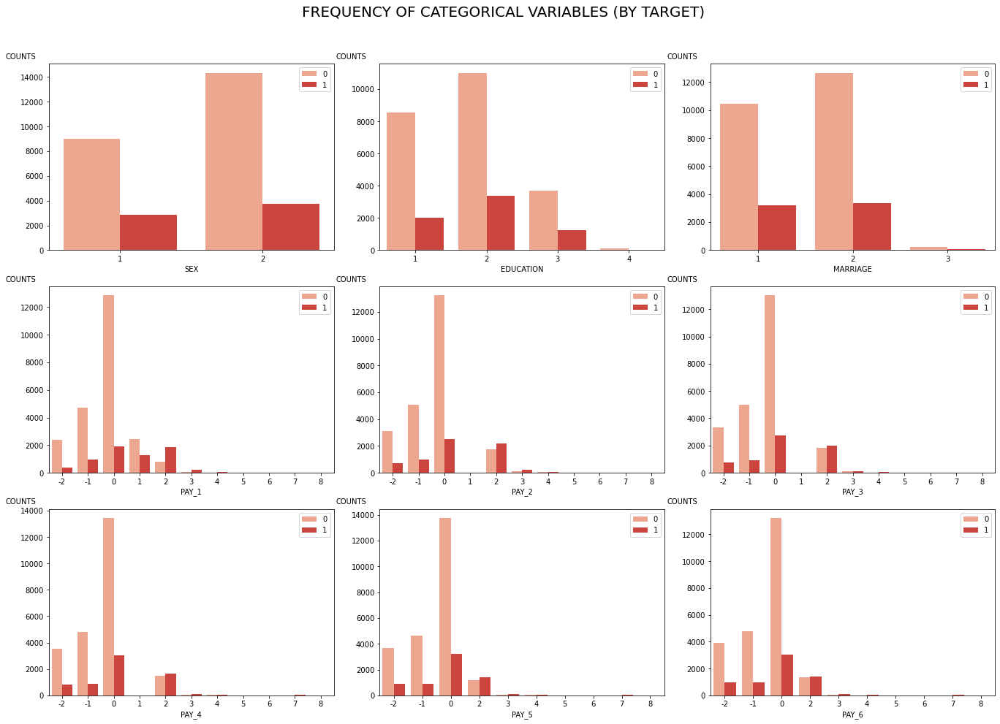

In [59]:
f, axes = plt.subplots(3, 3, figsize = (19,14), facecolor = 'white')
f.suptitle("FREQUENCY OF CATEGORICAL VARIABLES (BY TARGET)",size = 20)

# Creating plots of each categorical variable to target 
ax1 = sns.countplot(x = 'SEX', hue = 'DEFAULT', data = cat_df, palette ='Reds', ax = axes[0,0])
ax2 = sns.countplot(x = 'EDUCATION', hue = 'DEFAULT', data = cat_df, palette ='Reds', ax = axes[0,1])
ax3 = sns.countplot(x = 'MARRIAGE', hue = 'DEFAULT', data = cat_df, palette = 'Reds', ax = axes[0,2])
ax4 = sns.countplot(x = 'PAY_1', hue = 'DEFAULT', data = cat_df, palette = 'Reds', ax = axes[1,0])
ax5 = sns.countplot(x = 'PAY_2', hue = 'DEFAULT', data = cat_df, palette = 'Reds', ax = axes[1,1])
ax6 = sns.countplot(x = 'PAY_3', hue = 'DEFAULT', data = cat_df, palette = 'Reds', ax = axes[1,2])
ax7 = sns.countplot(x = 'PAY_4', hue = 'DEFAULT', data = cat_df, palette = 'Reds', ax = axes[2,0])
ax8 = sns.countplot(x = 'PAY_5', hue = 'DEFAULT', data = cat_df, palette = 'Reds', ax = axes[2,1])
ax9 = sns.countplot(x = 'PAY_6', hue = 'DEFAULT', data = cat_df, palette = 'Reds', ax = axes[2,2])

# Setting legends to upper right
ax1.legend(loc = "upper right")
ax2.legend(loc = "upper right")
ax3.legend(loc = "upper right")
ax4.legend(loc = "upper right")
ax5.legend(loc = "upper right")
ax6.legend(loc = "upper right")
ax7.legend(loc = "upper right")
ax8.legend(loc = "upper right")
ax9.legend(loc = "upper right")

# Changing ylabels to horizontal and changing their positions
ax1.set_ylabel('COUNTS', rotation = 0, labelpad = 40)  # Labelpad adjusts distance of the title from the graph
ax1.yaxis.set_label_coords(-0.1,1.02)              # (x, y)

ax2.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax2.yaxis.set_label_coords(-0.1,1.02)

ax3.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax3.yaxis.set_label_coords(-0.1,1.02)

ax4.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax4.yaxis.set_label_coords(-0.1,1.02)

ax5.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax5.yaxis.set_label_coords(-0.1,1.02)

ax6.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax6.yaxis.set_label_coords(-0.1,1.02)

ax7.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax7.yaxis.set_label_coords(-0.1,1.02)

ax8.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax8.yaxis.set_label_coords(-0.1,1.02)

ax9.set_ylabel('COUNTS', rotation = 0, labelpad = 40)
ax9.yaxis.set_label_coords(-0.1,1.02)

# Shifting the Super Title higher
f.tight_layout()  # Prevents graphs from overlapping with each other
f.subplots_adjust(top = 0.9)

## FREQUENCY DISTRIBUTION

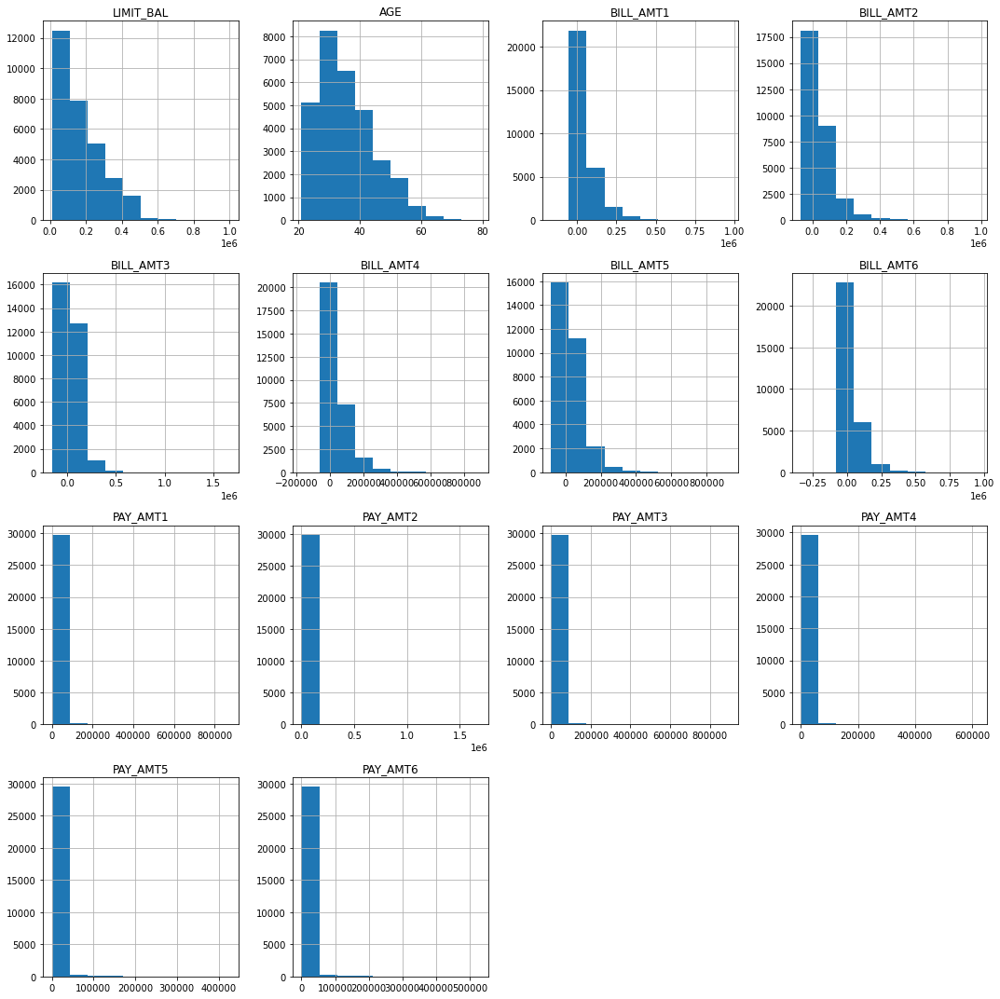

In [60]:
# Freq distribution of all data

fig, ax = plt.subplots(figsize = (15,15))
pd.DataFrame.hist(num_df,ax = ax)
plt.tight_layout()

# FEATURES CORRELATION

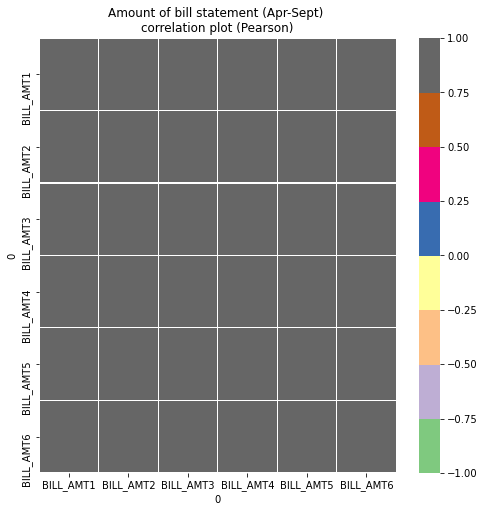

In [61]:
var = ['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']

plt.figure(figsize = (8,8))
plt.title('Amount of bill statement (Apr-Sept) \ncorrelation plot (Pearson)')

corr = df[var].corr()

sns.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, cmap = plt.cm.Accent, linewidths = .1, vmin = -1, vmax = 1)
plt.show()

Correlation is high for bill amounts between months.

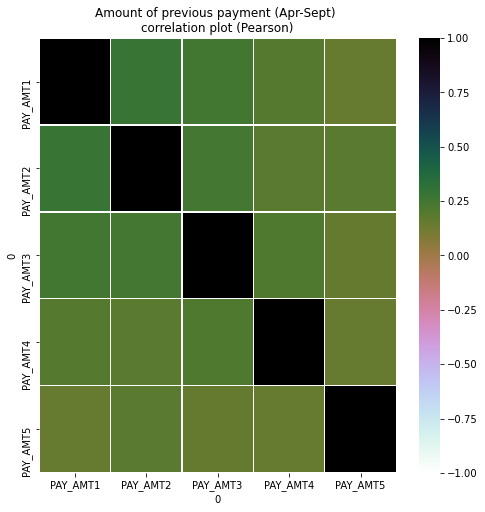

In [62]:
var1 = ['PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5']

plt.figure(figsize = (8,8))
plt.title('Amount of previous payment (Apr-Sept) \ncorrelation plot (Pearson)')

corr = df[var1].corr()

sns.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, cmap = plt.cm.cubehelix_r , linewidths = .1, vmin = -1, vmax = 1)
plt.show()

There is no correlation between amounts of previous payments for April-Sept 2005.

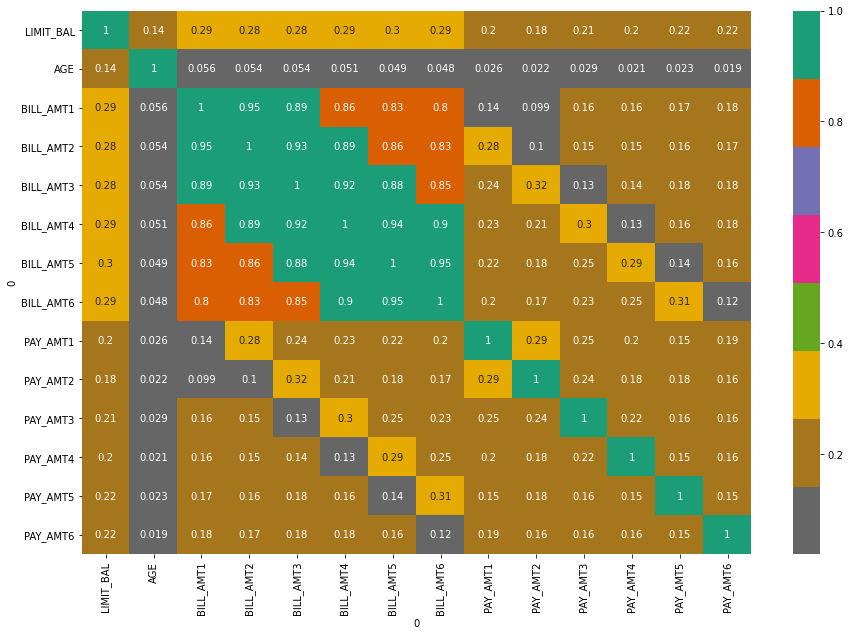

In [63]:
plt.figure(figsize = (15,10))
sns.heatmap(num_df.corr(),annot = True, cmap = plt.cm.Dark2_r)
plt.show()

# CLASS IMBALANCE

In [64]:
df['DEFAULT'].value_counts()

0    23364
1     6636
Name: DEFAULT, dtype: int64

In [65]:
df['DEFAULT'].value_counts(normalize = True)

0    0.7788
1    0.2212
Name: DEFAULT, dtype: float64

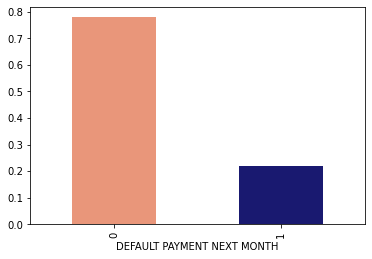

In [66]:
df['DEFAULT'].value_counts(normalize = True).plot(kind = 'bar', color = ['darksalmon','midnightblue'])
plt.xlabel('DEFAULT PAYMENT NEXT MONTH')
plt.show()

# ONE HOT ENCODING

In [67]:
df['DEFAULT'] = df['DEFAULT'].astype('int')

In [68]:
cat_df1 = df.select_dtypes(exclude = np.number)

In [69]:
df1 = pd.get_dummies(df, columns = cat_df1.columns, drop_first = True)

In [70]:
df1.head(2)

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT,SEX_2,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_2,MARRIAGE_3,PAY_1_-1,PAY_1_0,PAY_1_1,PAY_1_2,PAY_1_3,PAY_1_4,PAY_1_5,PAY_1_6,PAY_1_7,PAY_1_8,PAY_2_-1,PAY_2_0,PAY_2_1,PAY_2_2,PAY_2_3,PAY_2_4,PAY_2_5,PAY_2_6,PAY_2_7,PAY_2_8,PAY_3_-1,PAY_3_0,PAY_3_1,PAY_3_2,PAY_3_3,PAY_3_4,PAY_3_5,PAY_3_6,PAY_3_7,PAY_3_8,PAY_4_-1,PAY_4_0,PAY_4_1,PAY_4_2,PAY_4_3,PAY_4_4,PAY_4_5,PAY_4_6,PAY_4_7,PAY_4_8,PAY_5_-1,PAY_5_0,PAY_5_2,PAY_5_3,PAY_5_4,PAY_5_5,PAY_5_6,PAY_5_7,PAY_5_8,PAY_6_-1,PAY_6_0,PAY_6_2,PAY_6_3,PAY_6_4,PAY_6_5,PAY_6_6,PAY_6_7,PAY_6_8
0,20000,24,3913,3102,689,0,0,0,0,689,0,0,0,0,1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,120000,26,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [71]:
df1.shape

(30000, 79)

# PREDICTIVE MODELS

In [72]:
predictors = df1.drop(['DEFAULT'], axis = 1)

target = df1['DEFAULT']

# TRAIN TEST SPLIT

In [73]:
x_train, x_test, y_train, y_test = train_test_split(predictors,target, test_size = 0.3, random_state = 3, shuffle = True )

In [74]:
## Copying data for later usage

x_train_df = x_train.copy()
x_test_df = x_test.copy()
y_train_df = y_train.copy()
y_test_df = y_test.copy()

In [75]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(21000, 78)
(21000,)
(9000, 78)
(9000,)


# SMOTE-NC ALGORITHM FOR IMBALANCED CLASS

In [76]:
df1['DEFAULT'] = df1['DEFAULT'].astype('object')

In [77]:
sm = SMOTENC(categorical_features = [df1.dtypes == object], random_state = 3)

In [78]:
x_train_sm, y_train_sm = sm.fit_resample(x_train, y_train)

In [79]:
print(x_train_sm.shape)
print(y_train_sm.shape)

print(x_test.shape)
print(y_test.shape)

(32554, 78)
(32554,)
(9000, 78)
(9000,)


In [80]:
y_train_sm.value_counts()

0    16277
1    16277
Name: DEFAULT, dtype: int64

Class imbalance is treated using SMOTE-NC algorithm.

# FEATURE SELECTION

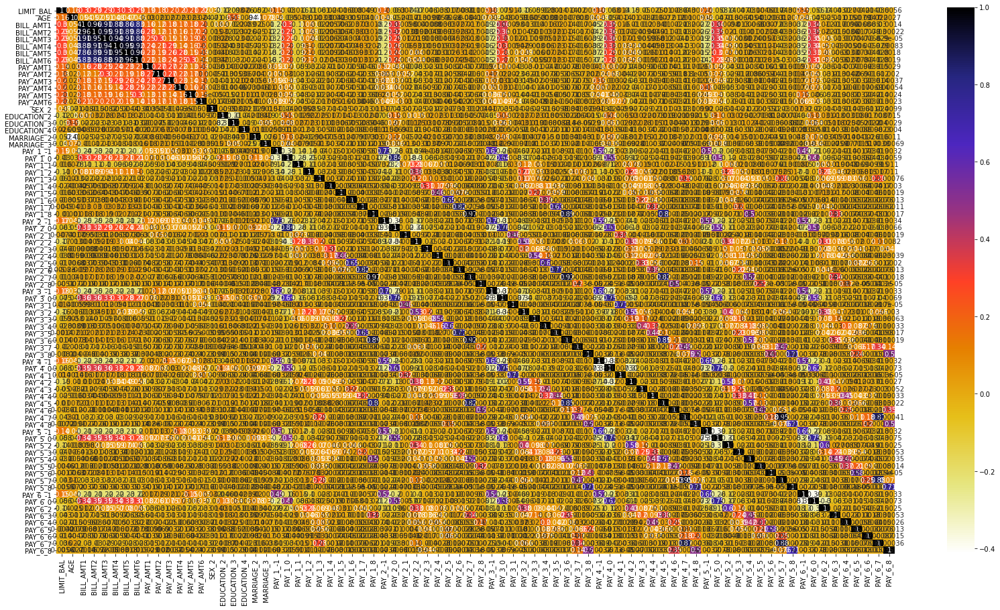

In [81]:
plt.figure(figsize = (28,15))
cor = x_train_sm.corr()
sns.heatmap(cor, annot = True, cmap = plt.cm.CMRmap_r)
plt.show()

In [82]:
cor

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,SEX_2,EDUCATION_2,EDUCATION_3,EDUCATION_4,MARRIAGE_2,MARRIAGE_3,PAY_1_-1,PAY_1_0,PAY_1_1,PAY_1_2,PAY_1_3,PAY_1_4,PAY_1_5,PAY_1_6,PAY_1_7,PAY_1_8,PAY_2_-1,PAY_2_0,PAY_2_1,PAY_2_2,PAY_2_3,PAY_2_4,PAY_2_5,PAY_2_6,PAY_2_7,PAY_2_8,PAY_3_-1,PAY_3_0,PAY_3_1,PAY_3_2,PAY_3_3,PAY_3_4,PAY_3_5,PAY_3_6,PAY_3_7,PAY_3_8,PAY_4_-1,PAY_4_0,PAY_4_1,PAY_4_2,PAY_4_3,PAY_4_4,PAY_4_5,PAY_4_6,PAY_4_7,PAY_4_8,PAY_5_-1,PAY_5_0,PAY_5_2,PAY_5_3,PAY_5_4,PAY_5_5,PAY_5_6,PAY_5_7,PAY_5_8,PAY_6_-1,PAY_6_0,PAY_6_2,PAY_6_3,PAY_6_4,PAY_6_5,PAY_6_6,PAY_6_7,PAY_6_8
LIMIT_BAL,1.000000,0.158039,0.297745,0.288755,0.289667,0.296820,0.300710,0.293139,0.192449,0.179709,0.203557,0.204046,0.211606,0.215540,0.038948,-0.121206,-0.097615,0.025971,-0.051675,-0.041018,0.148945,-0.030172,-0.016450,-0.111311,-0.061115,-0.024381,-0.016330,-0.008016,0.004887,-0.010042,0.167083,-0.063232,0.007361,-0.169670,-0.046215,-0.037845,-0.016785,0.000830,-0.011077,-0.005063,0.175103,-0.074945,0.013597,-0.160044,-0.059356,-0.028376,0.001420,-0.014102,-0.019701,-0.008093,0.156744,-0.068242,0.013653,-0.149857,-0.050373,-0.025051,-0.010384,-0.008590,-0.042563,-0.007161,0.144704,-0.058198,-0.140255,-0.047427,-0.031157,-0.004621,-0.001668,-0.042857,-0.005503,0.146890,-0.055956,-0.139137,-0.043449,-0.026880,-0.004208,-0.013738,-0.035631,-0.005608
AGE,0.158039,1.000000,0.053855,0.052191,0.051214,0.047679,0.047022,0.044932,0.030016,0.021086,0.027231,0.022770,0.023257,0.024495,-0.070699,-0.065908,0.193280,-0.009423,-0.413323,0.077986,0.040174,-0.035443,0.007845,-0.009958,0.003284,-0.000422,0.003321,-0.005078,0.004147,0.001013,0.048285,-0.052205,-0.001725,-0.012948,-0.009929,0.005857,-0.006844,-0.000052,0.004112,-0.007207,0.039143,-0.047913,-0.000593,-0.016049,0.005841,-0.008865,0.002097,0.000782,-0.008019,0.004023,0.048634,-0.054444,0.001358,-0.009955,-0.008239,-0.015623,0.007191,-0.012216,0.010470,0.000914,0.039876,-0.046668,-0.018108,-0.006358,-0.005361,0.001248,-0.006317,0.012272,0.007243,0.045576,-0.045232,-0.025295,-0.010900,-0.015085,0.000786,-0.004655,0.021927,0.002691
BILL_AMT1,0.297745,0.053855,1.000000,0.961560,0.914283,0.884155,0.856962,0.833165,0.161950,0.121441,0.177772,0.170603,0.182709,0.207424,-0.018242,0.036652,-0.022207,0.008880,-0.025229,-0.010296,-0.236464,0.298988,-0.111284,0.081069,-0.022134,0.005743,0.006192,0.003740,0.030458,0.017780,-0.254394,0.330629,0.009500,0.004046,-0.000884,0.000357,0.003692,0.027279,0.016891,-0.001855,-0.239901,0.356571,0.009799,-0.013212,-0.013545,0.001553,0.019527,0.013743,-0.016950,-0.004525,-0.221325,0.352482,0.016327,-0.010031,-0.012289,0.003367,0.010362,-0.002134,-0.032208,-0.002677,-0.207213,0.337673,0.009832,-0.012735,-0.000664,-0.003046,0.007238,-0.033317,-0.003666,-0.207377,0.343848,0.011513,-0.016791,-0.009574,0.000676,-0.008503,-0.030127,-0.001362
BILL_AMT2,0.288755,0.052191,0.961560,1.000000,0.945431,0.914329,0.885262,0.859171,0.281065,0.117653,0.172367,0.158039,0.169850,0.198752,-0.015440,0.032287,-0.023463,0.002611,-0.025393,-0.012284,-0.230371,0.282758,-0.108226,0.088944,-0.021502,0.006124,0.006359,0.003838,0.030424,0.018355,-0.245654,0.320066,-0.003269,0.009163,0.000486,0.000889,0.003934,0.027529,0.017461,-0.001810,-0.250076,0.357770,0.010305,0.004510,-0.010094,0.003691,0.020630,0.014399,-0.016549,-0.004049,-0.229384,0.358193,0.016719,0.002423,-0.009417,0.004917,0.011262,-0.001078,-0.031847,-0.002635,-0.216463,0.345039,0.020547,-0.010492,0.001045,-0.002114,0.008414,-0.032956,-0.003650,-0.214932,0.350246,0.022146,-0.014870,-0.008622,0.001704,-0.007940,-0.029998,-0.000221
BILL_AMT3,0.289667,0.051214,0.914283,0.945431,1.000000,0.941073,0.905983,0.879194,0.245754,0.301274,0.151218,0.152539,0.185217,0.202775,-0.008154,0.027951,-0.023022,0.002016,-0.026541,-0.013041,-0.216860,0.255756,-0.100568,0.093772,-0.021110,0.006827,0.004317,0.004045,0.030390,0.018685,-0.227967,0.287849,0.012371,0.019020,0.001839,0.000462,0.004

In [83]:
def correlation(dataset, threshold):
    col_corr = set()                                         # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:      # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]             # getting the name of column
                col_corr.add(colname)
    return col_corr

In [84]:
corr_features = correlation(x_train_sm, 0.8)
len(set(corr_features))

12

In [85]:
corr_features

{'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_2_0',
 'PAY_2_6',
 'PAY_2_7',
 'PAY_3_6',
 'PAY_4_5',
 'PAY_5_7',
 'PAY_6_7'}

These features should be dropped but according to the domain, it is not dropped and considered as significant features.

# DECISION TREE CLASSIFIER (BASELINE MODEL)

In [86]:
dtc = DecisionTreeClassifier()

In [87]:
dtc.fit(x_train_sm, y_train_sm)

DecisionTreeClassifier()

In [88]:
preds_5 = dtc.predict(x_test)

In [89]:
dtc.score(x_train_sm, y_train_sm)

0.9989862996866744

In [90]:
dtc.score(x_test, y_test)

0.6928888888888889

In [91]:
p5 = dtc.predict_proba(x_test)
p5

array([[1., 0.],
       [0., 1.],
       [1., 0.],
       ...,
       [0., 1.],
       [1., 0.],
       [1., 0.]])

In [92]:
dtc.feature_importances_

array([6.43927938e-02, 4.63293935e-02, 5.00575183e-02, 4.10621464e-02,
       5.92161647e-02, 3.17196875e-02, 2.72548740e-02, 3.95248584e-02,
       4.26955679e-02, 4.78030886e-02, 4.33470877e-02, 3.33708853e-02,
       2.87991115e-02, 3.37931154e-02, 7.30978496e-03, 1.85795723e-02,
       1.27624995e-02, 5.90681609e-04, 1.77624664e-02, 1.47730535e-03,
       8.45089541e-02, 1.55552469e-01, 3.71767015e-02, 3.64557920e-03,
       1.17297255e-03, 3.39920816e-04, 0.00000000e+00, 0.00000000e+00,
       2.41872345e-05, 0.00000000e+00, 2.53982597e-03, 1.36626790e-03,
       0.00000000e+00, 1.68635378e-03, 8.48269828e-04, 1.40983607e-03,
       2.15622131e-04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       3.82819913e-03, 2.90076511e-03, 0.00000000e+00, 1.13718208e-03,
       1.23752349e-05, 2.55042035e-04, 0.00000000e+00, 1.00241418e-04,
       0.00000000e+00, 0.00000000e+00, 1.16081827e-02, 7.80548634e-03,
       0.00000000e+00, 4.70300804e-03, 1.99380742e-04, 3.50724231e-04,
      

In [93]:
a = export_graphviz(dtc, out_file = None, feature_names = predictors.columns,
                    filled = True, precision = 2, rounded = True)

graph = graphviz.Source(a, format = "png")
graph

# VARIABLE IMPORTANCE PLOT

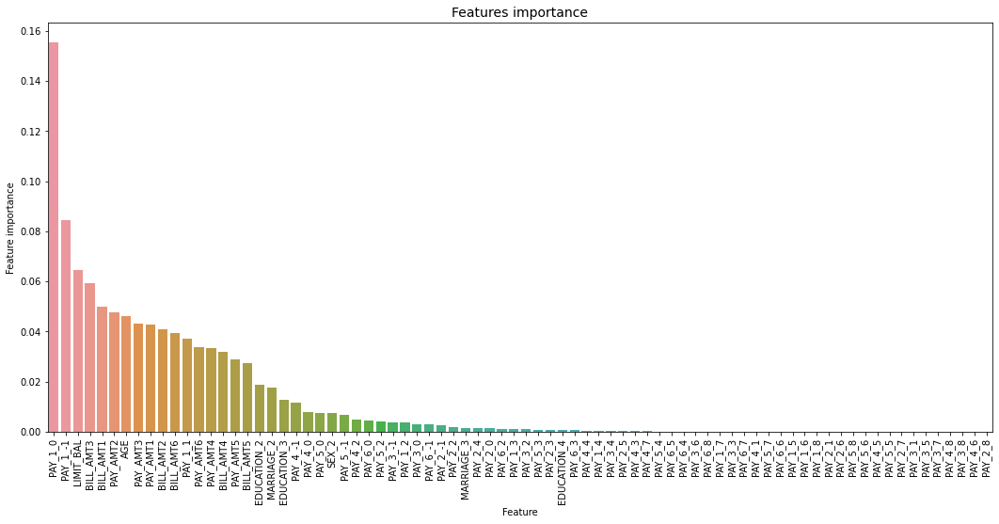

In [94]:
tmp = pd.DataFrame({'Feature' : predictors.columns, 'Feature importance' : dtc.feature_importances_})
tmp = tmp.sort_values(by = 'Feature importance', ascending = False)

plt.figure(figsize = (18,8))
plt.title('Features importance',fontsize = 14)

s = sns.barplot(x = 'Feature', y = 'Feature importance', data = tmp)
s.set_xticklabels(s.get_xticklabels(),rotation = 90)

plt.show() 

The significant features using Decision Tree Classifier are PAY_1_0, PAY_1_-1, BILL_AMT1, LIMIT_BAL, BILL_AMT3 and PAY_AMT2.

# BIAS / VARIANCE ERROR

In [95]:
kf = KFold(n_splits = 10, shuffle = True, random_state = 0)
scores5 = cross_val_score(dtc, predictors, target, cv = kf, scoring = 'roc_auc')

print('Bias Error:',1 - np.mean(scores5))
print('Variance Error:',np.std(scores5, ddof = 1))

Bias Error: 0.3888559445910932
Variance Error: 0.007357489595736108


# CLASSIFICATION REPORT

In [96]:
dtc_cv_score1 = cross_val_score(dtc, x_train_sm, y_train_sm, cv = 10, scoring = 'precision')
dtc_cv_score2 = cross_val_score(dtc, x_train_sm, y_train_sm, cv = 10, scoring = 'recall')
dtc_cv_score3 = cross_val_score(dtc, x_train_sm, y_train_sm, cv = 10, scoring = 'f1')
dtc_cv_score4 = cross_val_score(dtc, x_train_sm, y_train_sm, cv = 10, scoring = 'accuracy')
dtc_cv_score5 = cross_val_score(dtc, x_train_sm, y_train_sm, cv = 10, scoring = 'roc_auc')

In [97]:
s41 = precision_score(y_test, preds_5)
s42 = recall_score(y_test, preds_5)
s43 = f1_score(y_test, preds_5)
s44 = accuracy_score(y_test, preds_5)
s45 = roc_auc_score(y_test, preds_5)

In [98]:
print('Mean Precision Score - Decision Tree Classifier:',dtc_cv_score1.mean())
print('Test Precision Score - Decision Tree Classifier:', s41)
print()
print('Mean Recall Score - Decision Tree Classifier:',dtc_cv_score2.mean())
print('Test Recall Score - Decision Tree Classifier:', s42)
print()
print('Mean F1 Score - Decision Tree Classifier:',dtc_cv_score3.mean())
print('Test F1 Score - Decision Tree Classifier:', s43)
print()
print('Mean Accuracy Score - Decision Tree Classifier:',dtc_cv_score4.mean())
print('Test Accuracy Score - Decision Tree Classifier:', s44)
print()
print('Mean roc_auc_score - Decision Tree Classifier:',dtc_cv_score5.mean())
print('Test roc_auc_score - Decision Tree Classifier:', s45)

Mean Precision Score - Decision Tree Classifier: 0.7626641893591237
Test Precision Score - Decision Tree Classifier: 0.3280808080808081

Mean Recall Score - Decision Tree Classifier: 0.7878199048912018
Test Recall Score - Decision Tree Classifier: 0.42446419236800836

Mean F1 Score - Decision Tree Classifier: 0.7680003264584212
Test F1 Score - Decision Tree Classifier: 0.3701002734731085

Mean Accuracy Score - Decision Tree Classifier: 0.7757983559596462
Test Accuracy Score - Decision Tree Classifier: 0.6928888888888889

Mean roc_auc_score - Decision Tree Classifier: 0.7754142820609352
Test roc_auc_score - Decision Tree Classifier: 0.5949045951257285


In [99]:
print(classification_report(y_test, preds_5))

              precision    recall  f1-score   support

           0       0.83      0.77      0.80      7087
           1       0.33      0.42      0.37      1913

    accuracy                           0.69      9000
   macro avg       0.58      0.59      0.58      9000
weighted avg       0.72      0.69      0.71      9000



# CONFUSION MATRIX

In [100]:
print(confusion_matrix(y_test, preds_5))

[[5424 1663]
 [1101  812]]


In [101]:
y_test_1d = y_test.values.flatten()

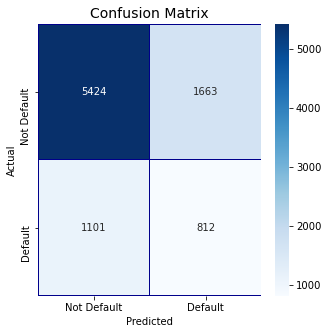

In [102]:
cm = pd.crosstab(y_test_1d, preds_5, rownames = ['Actual'], colnames = ['Predicted'])

fig, (ax1) = plt.subplots(ncols = 1, figsize = (5,5))

sns.heatmap(cm, 
            xticklabels = ['Not Default', 'Default'],
            yticklabels = ['Not Default', 'Default'],
            annot = True, ax = ax1, fmt = 'd',
            linewidths = .2, linecolor = "Darkblue", cmap = "Blues")

plt.title('Confusion Matrix', fontsize = 14)
plt.show()

# ROC CURVE

In [103]:
fpr5, tpr5, thresholds5 = roc_curve(y_test, p5[:, 1])
roc_auc5 = auc(fpr5, tpr5)
print("Area under the Decision Tree ROC curve : %f" % roc_auc5)

Area under the Decision Tree ROC curve : 0.595432


<Figure size 432x288 with 0 Axes>

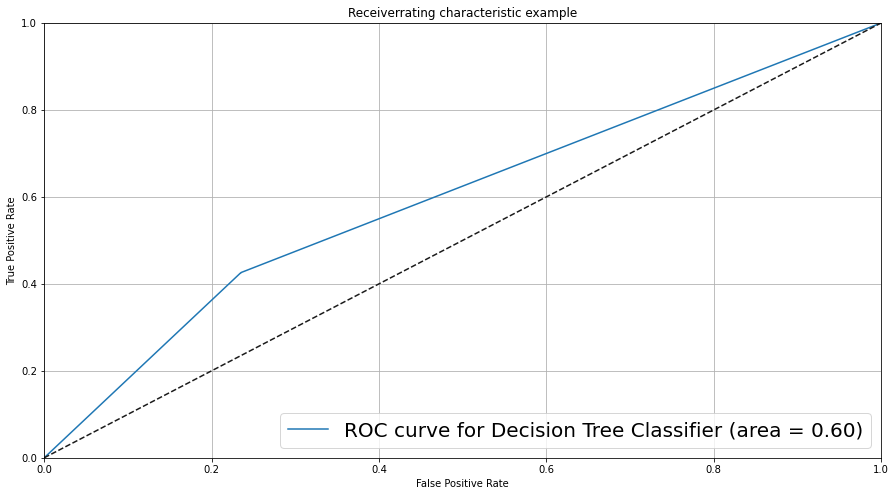

In [104]:
pl.clf()
plt.figure(figsize = (15,8))

pl.plot(fpr5, tpr5, label = 'ROC curve for Decision Tree Classifier (area = %0.2f)' % roc_auc5)

pl.plot([0, 1], 'k--')
pl.xlim([0.0, 1.0])
pl.ylim([0.0, 1.0])
pl.xlabel('False Positive Rate')
pl.ylabel('True Positive Rate')
pl.title('Receiverrating characteristic example')
pl.legend(loc = 'lower right', fontsize = 20)
plt.grid(True)
pl.show()

# RANDOM FOREST CLASSIFIER

In [105]:
rfc = RandomForestClassifier(n_jobs = 4, 
                             random_state = 3,
                             criterion = 'gini',
                             max_depth = 15,
                             min_samples_leaf = 10,
                             n_estimators = 100,
                             verbose = False)

In [106]:
rfc.fit(x_train_sm, y_train_sm)

RandomForestClassifier(max_depth=15, min_samples_leaf=10, n_jobs=4,
                       random_state=3, verbose=False)

In [107]:
preds_4 = rfc.predict(x_test)

In [108]:
rfc.feature_importances_

array([4.33534143e-02, 1.47105955e-02, 3.77888086e-02, 3.56713672e-02,
       3.08600504e-02, 3.14769174e-02, 2.67088111e-02, 2.98843377e-02,
       3.84416316e-02, 3.55930919e-02, 2.83649044e-02, 2.65283334e-02,
       2.47903333e-02, 2.63317025e-02, 2.96027796e-03, 1.53436283e-02,
       9.60145120e-03, 4.11191632e-05, 4.09787514e-02, 1.33384156e-04,
       2.88018157e-02, 1.28065670e-01, 1.91480283e-02, 2.21723438e-02,
       3.30736688e-04, 4.84526321e-05, 1.24086703e-05, 0.00000000e+00,
       0.00000000e+00, 2.02090986e-05, 3.40652517e-02, 6.85100760e-02,
       0.00000000e+00, 8.81994734e-03, 3.02633072e-04, 4.00495628e-04,
       2.62851333e-06, 0.00000000e+00, 1.86739136e-05, 0.00000000e+00,
       2.39876216e-02, 3.54671898e-02, 0.00000000e+00, 4.61054741e-03,
       1.69447294e-04, 5.84952790e-05, 0.00000000e+00, 8.99439031e-06,
       6.68499938e-07, 0.00000000e+00, 2.34184121e-02, 2.11197850e-02,
       0.00000000e+00, 3.25973678e-03, 1.61843152e-04, 4.32448145e-05,
      

In [109]:
rfc.score(x_train_sm, y_train_sm)

0.8557473735946427

In [110]:
rfc.score(x_test, y_test)

0.7901111111111111

In [111]:
p4 = rfc.predict_proba(x_test)
p4

array([[0.54720357, 0.45279643],
       [0.40464543, 0.59535457],
       [0.59263219, 0.40736781],
       ...,
       [0.70733145, 0.29266855],
       [0.85159044, 0.14840956],
       [0.57676023, 0.42323977]])

In [112]:
estimator = rfc.estimators_[5]

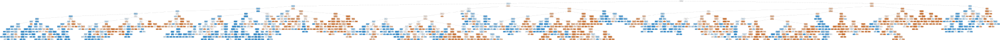

In [113]:
d = export_graphviz(estimator, out_file = None,
                    feature_names = predictors.columns, filled = True,
                    rounded = True, proportion = False, precision = 2,)

graph = graphviz.Source(d, format = "png")
graph

# VARIABLE IMPORTANCE PLOT

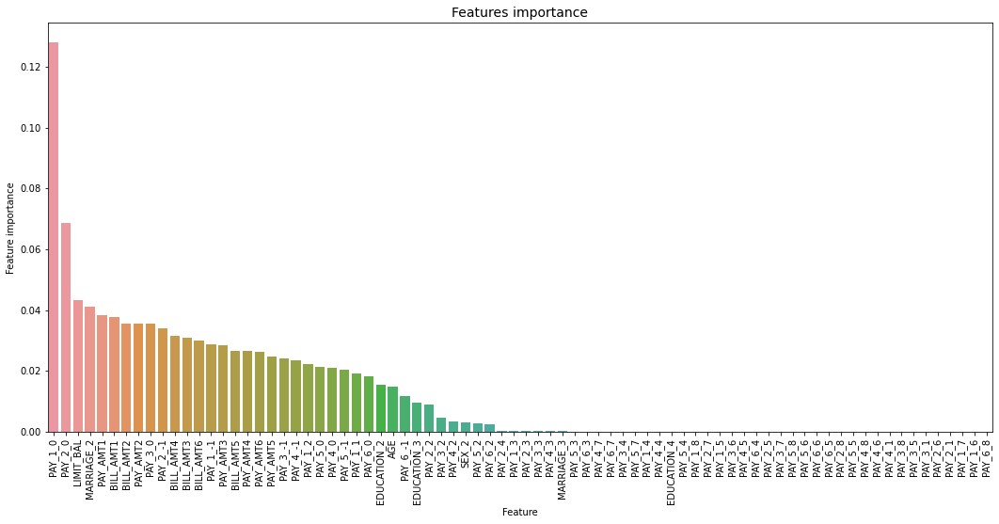

In [114]:
tmp = pd.DataFrame({'Feature' : predictors.columns, 'Feature importance' : rfc.feature_importances_})
tmp = tmp.sort_values(by = 'Feature importance', ascending = False)

plt.figure(figsize = (18,8))
plt.title('Features importance',fontsize = 14)

s = sns.barplot(x = 'Feature', y = 'Feature importance', data = tmp)
s.set_xticklabels(s.get_xticklabels(),rotation = 90)

plt.show() 

The important features using Random Forest Classifier are PAY_1_0, PAY_2_0, LIMIT_BAL, MARRIAGE_2, BILL_AMT1 and PAY_AMT1.

# BIAS / VARIANCE ERROR

In [115]:
kf = KFold(n_splits = 10, shuffle = True, random_state = 0)
scores4 = cross_val_score(rfc, predictors, target, cv = kf, scoring = 'roc_auc')

print('Bias Error:',1 - np.mean(scores4))
print('Variance Error:',np.std(scores4, ddof = 1))

Bias Error: 0.21929407161669912
Variance Error: 0.009253515692972522


# CLASSIFICATION REPORT

In [116]:
rfc_cv_score1 = cross_val_score(rfc, x_train_sm, y_train_sm, cv = 10, scoring = 'precision')
rfc_cv_score2 = cross_val_score(rfc, x_train_sm, y_train_sm, cv = 10, scoring = 'recall')
rfc_cv_score3 = cross_val_score(rfc, x_train_sm, y_train_sm, cv = 10, scoring = 'f1')
rfc_cv_score4 = cross_val_score(rfc, x_train_sm, y_train_sm, cv = 10, scoring = 'accuracy')
rfc_cv_score5 = cross_val_score(rfc, x_train_sm, y_train_sm, cv = 10, scoring = 'roc_auc')

In [117]:
s31 = precision_score(y_test, preds_4)
s32 = recall_score(y_test, preds_4)
s33 = f1_score(y_test, preds_4)
s34 = accuracy_score(y_test, preds_4)
s35 = roc_auc_score(y_test, preds_4)

In [118]:
print('Mean Precision Score - Random Forest Classifier:',rfc_cv_score1.mean())
print('Test Precision Score - Random Forest Classifier:', s31)
print()
print('Mean Recall Score - Random Forest Classifier:',rfc_cv_score2.mean())
print('Test Recall Score - Random Forest Classifier:', s32)
print()
print('Mean F1 Score - Random Forest Classifier:',rfc_cv_score3.mean())
print('Test F1 Score - Random Forest Classifier:', s33)
print()
print('Mean Accuracy Score - Random Forest Classifier:',rfc_cv_score4.mean())
print('Test Accuracy Score - Random Forest Classifier:', s34)
print()
print('Mean roc_auc_score - Random Forest Classifier:',rfc_cv_score5.mean())
print('Test roc_auc_score - Random ForesClassifier:', s35)

Mean Precision Score - Random Forest Classifier: 0.8390523551089106
Test Precision Score - Random Forest Classifier: 0.5062305295950156

Mean Recall Score - Random Forest Classifier: 0.7752246337525993
Test Recall Score - Random Forest Classifier: 0.5096706743335075

Mean F1 Score - Random Forest Classifier: 0.7976131107467485
Test F1 Score - Random Forest Classifier: 0.5079447772857515

Mean Accuracy Score - Random Forest Classifier: 0.8166225651709522
Test Accuracy Score - Random Forest Classifier: 0.7901111111111111

Mean roc_auc_score - Random Forest Classifier: 0.8973610102761957
Test roc_auc_score - Random ForesClassifier: 0.68774065676602


In [119]:
print(classification_report(y_test, preds_4))

              precision    recall  f1-score   support

           0       0.87      0.87      0.87      7087
           1       0.51      0.51      0.51      1913

    accuracy                           0.79      9000
   macro avg       0.69      0.69      0.69      9000
weighted avg       0.79      0.79      0.79      9000



# CONFUSION MATRIX

In [120]:
print(confusion_matrix(y_test, preds_4))

[[6136  951]
 [ 938  975]]


In [121]:
y_test_1d = y_test.values.flatten()

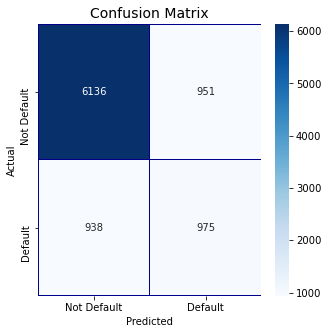

In [122]:
cm = pd.crosstab(y_test_1d, preds_4, rownames = ['Actual'], colnames = ['Predicted'])

fig, (ax1) = plt.subplots(ncols = 1, figsize = (5,5))

sns.heatmap(cm, 
            xticklabels = ['Not Default', 'Default'],
            yticklabels = ['Not Default', 'Default'],
            annot = True, ax = ax1, fmt = 'd',
            linewidths = .2, linecolor = "Darkblue", cmap = "Blues")

plt.title('Confusion Matrix', fontsize = 14)
plt.show()

In [123]:
# ROC CURVE

In [124]:
fpr4, tpr4, thresholds4 = roc_curve(y_test, p4[:, 1])
roc_auc4 = auc(fpr4, tpr4)
print("Area under the Random Forest ROC curve : %f" % roc_auc4)

Area under the Random Forest ROC curve : 0.763328


<Figure size 432x288 with 0 Axes>

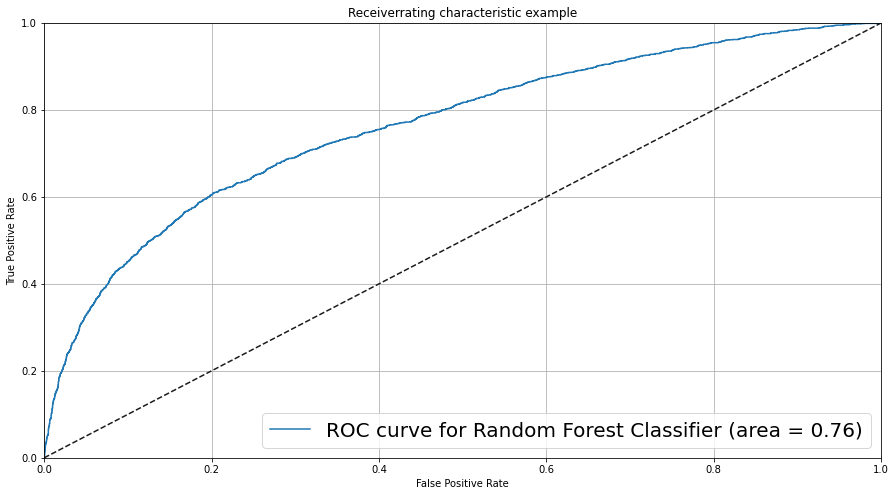

In [125]:
pl.clf()
plt.figure(figsize = (15,8))

pl.plot(fpr4, tpr4, label = 'ROC curve for Random Forest Classifier (area = %0.2f)' % roc_auc4)

pl.plot([0, 1], 'k--')
pl.xlim([0.0, 1.0])
pl.ylim([0.0, 1.0])
pl.xlabel('False Positive Rate')
pl.ylabel('True Positive Rate')
pl.title('Receiverrating characteristic example')
pl.legend(loc = 'lower right', fontsize = 20)
plt.grid(True)
pl.show()

# DISPLAYING THE SCORES OF EACH MODEL

### PRECISION, RECALL, F1, ACCURACY AND ROC AUC SCORE

In [126]:
pd.DataFrame({'Precision' : [dtc_cv_score1.mean(), s41, rfc_cv_score1.mean(), s31],
              'Recall' : [dtc_cv_score2.mean(), s42, rfc_cv_score2.mean(), s32],
              'F1 Score' : [dtc_cv_score3.mean(), s43, rfc_cv_score3.mean(), s33],
              'Accuracy' : [dtc_cv_score4.mean(), s44, rfc_cv_score4.mean(), s34],
              'Roc_auc' : [dtc_cv_score5.mean(), s45, rfc_cv_score5.mean(), s35]},
                      
              index = ['Decision Tree (Train)', 'Decision Tree (Test)', 
                       'Random Forest (Train)', 'Random Forest (Test)'])

,Precision,Recall,F1 Score,Accuracy,Roc_auc
Decision Tree (Train),0.762664,0.787820,0.768000,0.775798,0.775414
Decision Tree (Test),0.328081,0.424464,0.370100,0.692889,0.594905
Random Forest (Train),0.839052,0.775225,0.797613,0.816623,0.897361
Random Forest (Test),0.506231,0.509671,0.507945,0.790111,0.687741


### ROC CURVE

In [127]:
fpr5, tpr5, thresholds5 = roc_curve(y_test, p5[:, 1])
roc_auc5 = auc(fpr5, tpr5)
print("Area under the Decision Tree ROC curve : %f" % roc_auc5)

fpr4, tpr4, thresholds4 = roc_curve(y_test, p4[:, 1])
roc_auc4 = auc(fpr4, tpr4)
print("Area under the Random Forest ROC curve : %f" % roc_auc4)

Area under the Decision Tree ROC curve : 0.595432
Area under the Random Forest ROC curve : 0.763328


In [128]:
pd.DataFrame({'AUC score' : [0.595027, 0.763328]}, index = ['Decision Tree', 'Random Forest'])

,AUC score
Decision Tree,0.595027
Random Forest,0.763328


<Figure size 432x288 with 0 Axes>

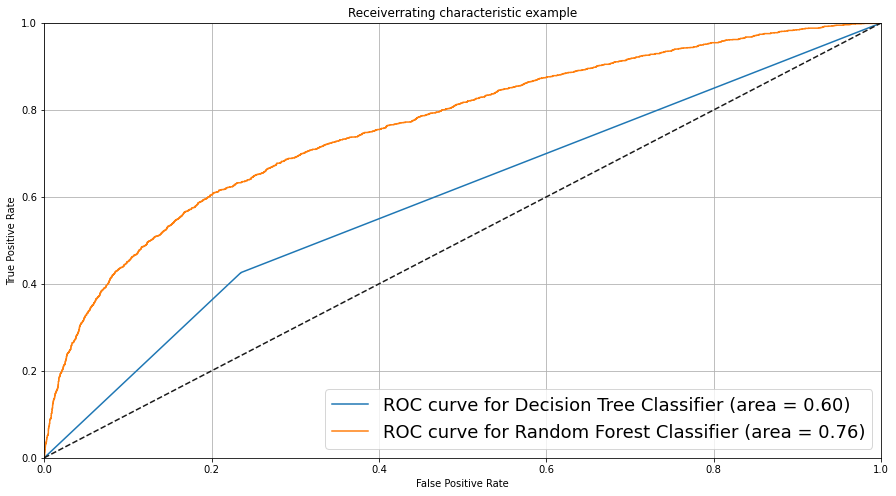

In [129]:
pl.clf()
plt.figure(figsize = (15,8))

pl.plot(fpr5, tpr5, label = 'ROC curve for Decision Tree Classifier (area = %0.2f)' % roc_auc5)
pl.plot(fpr4, tpr4, label = 'ROC curve for Random Forest Classifier (area = %0.2f)' % roc_auc4)

pl.plot([0, 1], [0, 1], 'k--')
pl.xlim([0.0, 1.0])
pl.ylim([0.0, 1.0])
pl.xlabel('False Positive Rate')
pl.ylabel('True Positive Rate')
pl.title('Receiverrating characteristic example')
pl.legend(loc = 'lower right', fontsize = 18)
plt.grid(True)
pl.show()

### BIAS AND VARIANCE ERROR

In [130]:
print('-' * 39,'Decision Tree Classifier','-' * 39)
print()
print('Bias Error:',1 - np.mean(scores5))
print('Variance Error:',np.std(scores5, ddof = 1))
print()

print('-' * 39,'Random Forest Classifier','-' * 39)
print()
print('Bias Error:',1 - np.mean(scores4))
print('Variance Error:',np.std(scores4, ddof = 1))

--------------------------------------- Decision Tree Classifier ---------------------------------------

Bias Error: 0.3888559445910932
Variance Error: 0.007357489595736108

--------------------------------------- Random Forest Classifier ---------------------------------------

Bias Error: 0.21929407161669912
Variance Error: 0.009253515692972522


In [131]:
pd.DataFrame({'Bias Error' : [0.38690511094298985, 0.21929407161669912],
              'Variance Error' : [0.008261387976349387, 0.009253515692972522]},
            
               index = ['Decision Tree', 'Random Forest'])

,Bias Error,Variance Error
Decision Tree,0.386905,0.008261
Random Forest,0.219294,0.009254


### CROSS VALIDATION SCORE

In [132]:
print('-' * 39,'Decision Tree Classifier','-' * 39)
print()
print('Average CV score of Decision Tree :{}'.format(scores5.mean()))
print()

print('-' * 39,'Random Forest Classifier','-' * 39)
print()
print('Average CV score of Random Forest :{}'.format(scores4.mean()))

--------------------------------------- Decision Tree Classifier ---------------------------------------

Average CV score of Decision Tree :0.6111440554089068

--------------------------------------- Random Forest Classifier ---------------------------------------

Average CV score of Random Forest :0.7807059283833009


In [133]:
pd.DataFrame({'Average CV score' : [0.6134431113756047, 0.7807059283833009]},
              index = ['Decision Tree', 'Random Forest'])

,Average CV score
Decision Tree,0.613443
Random Forest,0.780706


From the above scores, we can infer that <b>Random Forest Classifier</b> has the best score among all of them.

# FINAL MODEL

In [134]:
x_train_sm1 = pd.DataFrame(x_train_sm, columns = predictors.columns)
x_test1 = pd.DataFrame(x_test, columns = predictors.columns)

y_train_sm1 = pd.DataFrame(y_train_sm)
y_test1 = pd.DataFrame(y_test)

### RANDOM FOREST

Top 10 features of Random Forest Classifier are as follows:

In [135]:
sig_fea = ['PAY_1_0', 'PAY_2_0', 'LIMIT_BAL', 'MARRIAGE_2', 'PAY_AMT1', 'BILL_AMT1', 'BILL_AMT2', 'PAY_AMT2', 'PAY_3_0', 'PAY_2_-1']

In [136]:
rfc1 = RandomForestClassifier(n_jobs = 4, 
                             random_state = 3,
                             criterion = 'gini',
                             max_depth = 25,
                             min_samples_leaf = 25,
                             n_estimators = 100,
                             verbose = False)

In [137]:
rfc1.fit(x_train_sm1[sig_fea], y_train_sm1)

RandomForestClassifier(max_depth=25, min_samples_leaf=25, n_jobs=4,
                       random_state=3, verbose=False)

In [138]:
y_pred = rfc1.predict(x_test1[sig_fea])

In [139]:
rfc1.feature_importances_

array([0.24021007, 0.08069285, 0.09436187, 0.0654987 , 0.09165287,
       0.09236553, 0.09749523, 0.08041598, 0.04392841, 0.11337849])

In [140]:
rfc1.score(x_train_sm1[sig_fea], y_train_sm1)

0.7999938563617374

In [141]:
rfc1.score(x_test1[sig_fea], y_test1)

0.7641111111111111

In [142]:
p = rfc1.predict_proba(x_test1[sig_fea])
p

array([[0.50533162, 0.49466838],
       [0.46532591, 0.53467409],
       [0.47001068, 0.52998932],
       ...,
       [0.74541374, 0.25458626],
       [0.78870969, 0.21129031],
       [0.29226323, 0.70773677]])

In [143]:
estimator = rfc1.estimators_[5]

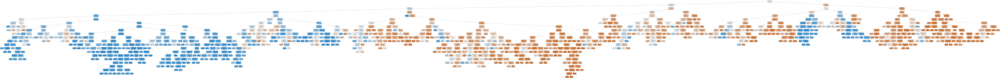

In [144]:
j = export_graphviz(estimator, out_file = None,
                    feature_names = sig_fea, filled = True,
                    rounded = True, proportion = False, precision = 2,)

graph = graphviz.Source(j, format = "png")
graph

# VARIABLE IMPORTANCE PLOT

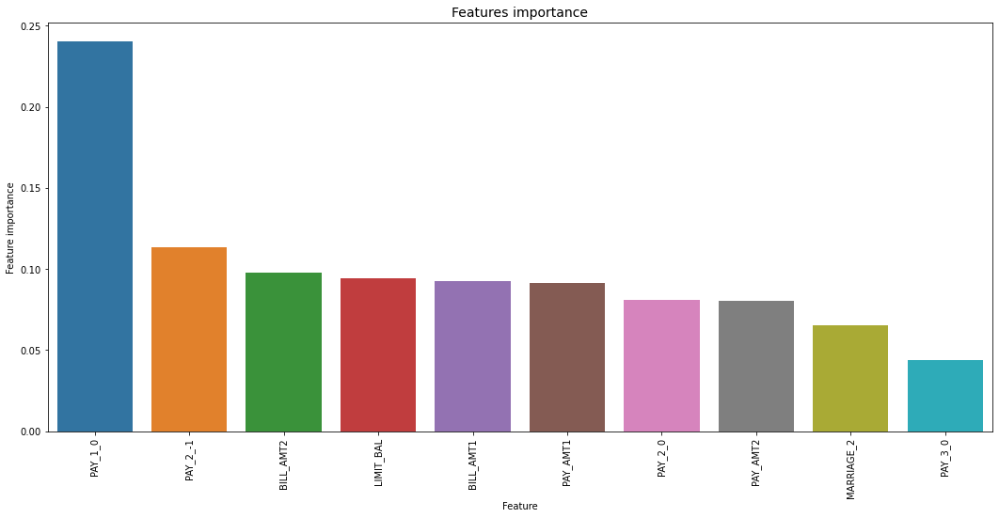

In [145]:
tmp = pd.DataFrame({'Feature' : sig_fea, 'Feature importance' : rfc1.feature_importances_})
tmp = tmp.sort_values(by = 'Feature importance', ascending = False)

plt.figure(figsize = (18,8))
plt.title('Features importance',fontsize = 14)

s = sns.barplot(x = 'Feature', y = 'Feature importance', data = tmp)
s.set_xticklabels(s.get_xticklabels(),rotation = 90)

plt.show() 

The top 3 features are PAY_1_0, PAY_2_-1 and BILL_AMT2.

# BIAS / VARIANCE ERROR

In [146]:
kf = KFold(n_splits = 10, shuffle = True, random_state = 0)
scores = cross_val_score(rfc1, predictors[sig_fea], target, cv = kf, scoring = 'roc_auc')

print('Bias Error:',1 - np.mean(scores))
print('Variance Error:',np.std(scores, ddof = 1))

Bias Error: 0.23924297223015978
Variance Error: 0.009493698025127778


# CLASSIFICATION REPORT

In [147]:
rfc1_cv_score1 = cross_val_score(rfc1, x_train_sm1[sig_fea], y_train_sm1, cv = 10, scoring = 'precision')
rfc1_cv_score2 = cross_val_score(rfc1, x_train_sm1[sig_fea], y_train_sm1, cv = 10, scoring = 'recall')
rfc1_cv_score3 = cross_val_score(rfc1, x_train_sm1[sig_fea], y_train_sm1, cv = 10, scoring = 'f1')
rfc1_cv_score4 = cross_val_score(rfc1, x_train_sm1[sig_fea], y_train_sm1, cv = 10, scoring = 'accuracy')
rfc1_cv_score5 = cross_val_score(rfc1, x_train_sm1[sig_fea], y_train_sm1, cv = 10, scoring = 'roc_auc')

In [148]:
t31 = precision_score(y_test1, y_pred)
t32 = recall_score(y_test1, y_pred)
t33 = f1_score(y_test1, y_pred)
t34 = accuracy_score(y_test1, y_pred)
t35 = roc_auc_score(y_test1, y_pred)

In [149]:
print('Mean Precision Score - Random Forest Classifier:',rfc1_cv_score1.mean())
print('Test Precision Score - Random Forest Classifier:', t31)
print()
print('Mean Recall Score - Random Forest Classifier:',rfc1_cv_score2.mean())
print('Test Recall Score - Random Forest Classifier:', t32)
print()
print('Mean F1 Score - Random Forest Classifier:',rfc1_cv_score3.mean())
print('Test F1 Score - Random Forest Classifier:', t33)
print()
print('Mean Accuracy Score - Random Forest Classifier:',rfc1_cv_score4.mean())
print('Test Accuracy Score - Random Forest Classifier:', t34)
print()
print('Mean roc_auc_score - Random Forest Classifier:',rfc1_cv_score5.mean())
print('Test roc_auc_score - Random ForesClassifier:', t35)

Mean Precision Score - Random Forest Classifier: 0.7982442605454226
Test Precision Score - Random Forest Classifier: 0.4534986713906112

Mean Recall Score - Random Forest Classifier: 0.7402005318723204
Test Recall Score - Random Forest Classifier: 0.5352848928384736

Mean F1 Score - Random Forest Classifier: 0.7640314751181428
Test F1 Score - Random Forest Classifier: 0.49100935027571324

Mean Accuracy Score - Random Forest Classifier: 0.7791130541936994
Test Accuracy Score - Random Forest Classifier: 0.7641111111111111

Mean roc_auc_score - Random Forest Classifier: 0.8607871714512105
Test roc_auc_score - Random ForesClassifier: 0.6805816308414183


In [150]:
print(classification_report(y_test1, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      7087
           1       0.45      0.54      0.49      1913

    accuracy                           0.76      9000
   macro avg       0.66      0.68      0.67      9000
weighted avg       0.78      0.76      0.77      9000



# CONFUSION MATRIX

In [151]:
print(confusion_matrix(y_test1, y_pred))

[[5853 1234]
 [ 889 1024]]


In [152]:
y_test_1d = y_test1.values.flatten()

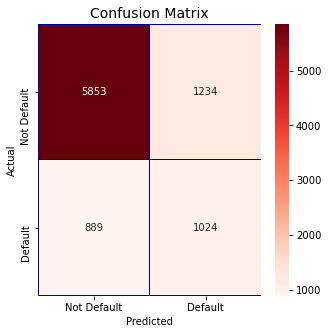

In [153]:
cm = pd.crosstab(y_test_1d, y_pred, rownames = ['Actual'], colnames = ['Predicted'])

fig, (ax1) = plt.subplots(ncols = 1, figsize = (5,5))

sns.heatmap(cm, 
            xticklabels = ['Not Default', 'Default'],
            yticklabels = ['Not Default', 'Default'],
            annot = True, ax = ax1, fmt = 'd',
            linewidths = .2, linecolor = "Darkblue", cmap = "Reds")

plt.title('Confusion Matrix', fontsize = 14)
plt.show()

# ROC CURVE

In [154]:
fpr, tpr, thresholds = roc_curve(y_test1, p[:, 1])
roc_auc = auc(fpr, tpr)
print("Area under the Random Forest ROC curve : %f" % roc_auc)

Area under the Random Forest ROC curve : 0.749042


<Figure size 432x288 with 0 Axes>

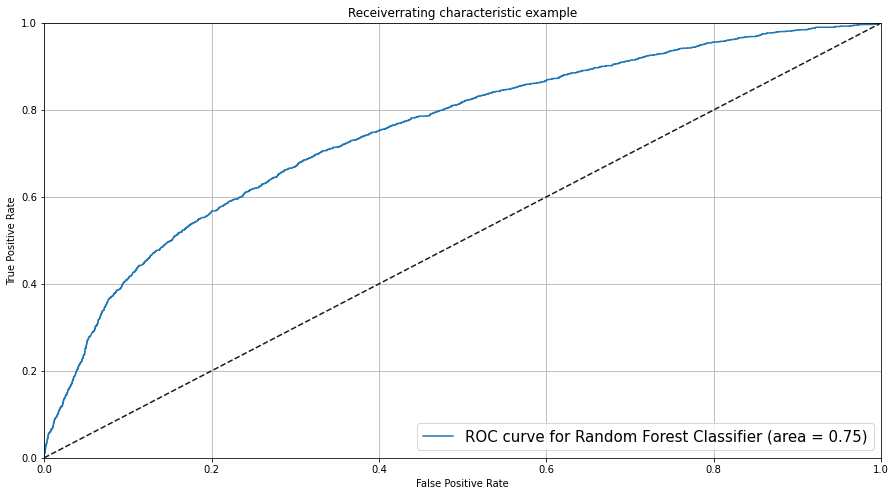

In [155]:
pl.clf()
plt.figure(figsize = (15,8))

pl.plot(fpr, tpr, label = 'ROC curve for Random Forest Classifier (area = %0.2f)' % roc_auc)

pl.plot([0, 1], 'k--')
pl.xlim([0.0, 1.0])
pl.ylim([0.0, 1.0])
pl.xlabel('False Positive Rate')
pl.ylabel('True Positive Rate')
pl.title('Receiverrating characteristic example')
pl.legend(loc = 'lower right', fontsize = 15)
plt.grid(True)
pl.show()

# DISPLAYING THE METRIC SCORES

In [156]:
pd.DataFrame({'Precision' : [rfc_cv_score1.mean(), t31],
              'Recall' : [rfc_cv_score2.mean(), t32],
              'F1 Score' : [rfc_cv_score3.mean(), t33],
              'Accuracy' : [rfc_cv_score4.mean(), t34],
              'Roc_auc' : [rfc_cv_score5.mean(), t35]},
                      
              index = ['Random Forest (Train)', 'Random Forest (Test)'])

,Precision,Recall,F1 Score,Accuracy,Roc_auc
Random Forest (Train),0.839052,0.775225,0.797613,0.816623,0.897361
Random Forest (Test),0.453499,0.535285,0.491009,0.764111,0.680582


In [157]:
pd.DataFrame({'Bias Error' : 1 - np.mean(scores), 'Variance Error' : np.std(scores, ddof = 1)}, index = ['Random Forest'])

,Bias Error,Variance Error
Random Forest,0.239243,0.009494


In [158]:
print('-' * 39,'Random Forest Classifier','-' * 39)
print()
print('Average CV score of Random Forest :{}'.format(scores.mean()))

--------------------------------------- Random Forest Classifier ---------------------------------------

Average CV score of Random Forest :0.7607570277698402
